# Final Code For Music Genre Classification

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import sklearn.metrics as skm
import sklearn.model_selection as skms
import sklearn.preprocessing as skp
import random
import librosa,IPython
import librosa.display as lplt

from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.model_selection import KFold
from sklearn.pipeline import make_pipeline

from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve, precision_score, recall_score, f1_score,classification_report
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score

## 30 seconds dataset

In [3]:
data30=pd.read_csv(r"C:\Users\sanja\OneDrive\Desktop\SEM 4\AIML\Dataset\case_study_features_30_sec.csv")
data30.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [4]:
data30.describe()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,662030.846000,0.378682,0.086340,0.130930,0.003051,2201.780898,4.696916e+05,2242.541070,137079.155165,4571.549304,...,1.148144,60.730958,-3.966028,62.633624,0.507696,63.712586,-2.328761,66.231930,-1.095348,70.126096
std,1784.073992,0.081705,0.007735,0.065683,0.003634,715.960600,4.008995e+05,526.316473,96455.666326,1574.791602,...,4.578948,33.781951,4.549697,33.479172,3.869105,34.401977,3.755957,37.174631,3.837007,45.228512
min,660000.000000,0.171939,0.044555,0.005276,0.000004,570.040355,7.911251e+03,898.066208,10787.185064,749.140636,...,-15.693844,9.169314,-17.234728,13.931521,-11.963694,15.420555,-18.501955,13.487622,-19.929634,7.956583
25%,661504.000000,0.319562,0.082298,0.086657,0.000942,1627.697311,1.843505e+05,1907.240605,67376.554428,3380.069642,...,-1.863280,40.376442,-7.207225,40.830875,-2.007015,41.884240,-4.662925,41.710184,-3.368996,42.372865
50%,661794.000000,0.383148,0.086615,0.122443,0.001816,2209.263090,3.384862e+05,2221.392843,111977.548036,4658.524473,...,1.212809,52.325077,-4.065605,54.717674,0.669643,54.804890,-2.393862,57.423059,-1.166289,59.186117
75%,661794.000000,0.435942,0.091256,0.175682,0.003577,2691.294667,6.121479e+05,2578.469836,182371.576801,5533.810460,...,4.359662,71.691755,-0.838737,75.040838,3.119212,75.385832,0.150573,78.626444,1.312615,85.375374
max,675808.000000,0.663685,0.108111,0.397973,0.027679,4435.243901,3.036843e+06,3509.646417,694784.811549,8677.672688,...,13.457150,392.932373,11.482946,406.058868,15.388390,332.905426,14.694924,393.161987,15.369627,506.065155


In [5]:
data30.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 1000 non-null   object 
 1   length                   1000 non-null   int64  
 2   chroma_stft_mean         1000 non-null   float64
 3   chroma_stft_var          1000 non-null   float64
 4   rms_mean                 1000 non-null   float64
 5   rms_var                  1000 non-null   float64
 6   spectral_centroid_mean   1000 non-null   float64
 7   spectral_centroid_var    1000 non-null   float64
 8   spectral_bandwidth_mean  1000 non-null   float64
 9   spectral_bandwidth_var   1000 non-null   float64
 10  rolloff_mean             1000 non-null   float64
 11  rolloff_var              1000 non-null   float64
 12  zero_crossing_rate_mean  1000 non-null   float64
 13  zero_crossing_rate_var   1000 non-null   float64
 14  harmony_mean             

## Audio Sample

In [8]:
audio=r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\blues\blues.00011.wav"
audio_data,sr=librosa.load(audio)
audio_data, _=librosa.effects.trim(audio_data)
IPython.display.Audio(audio_data,rate=sr)

## Audio waveplot

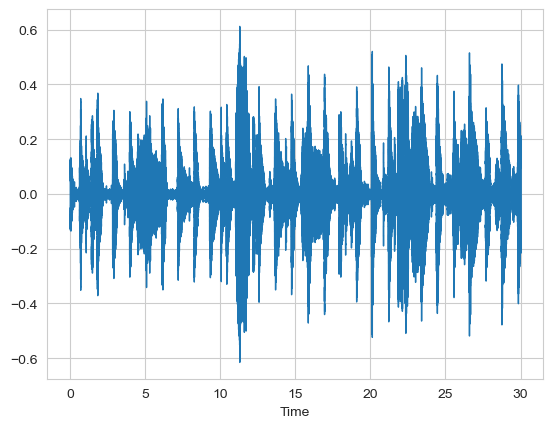

In [9]:
lplt.waveshow(audio_data)
plt.show()

## Waveplot for first 500 samples and its corresponding Fourier Transform

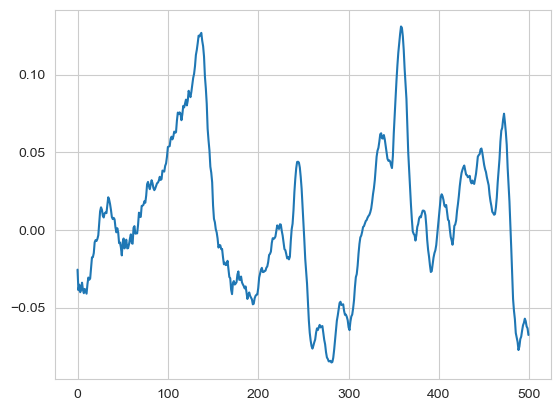

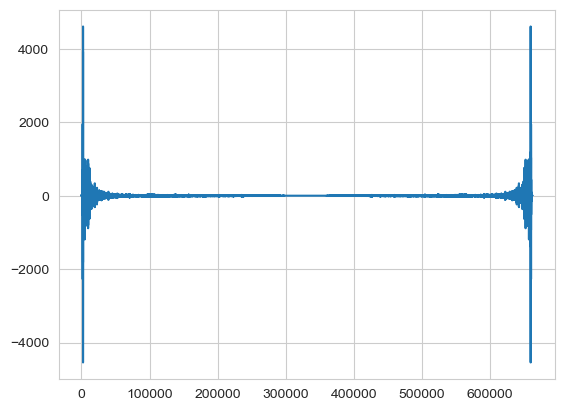

In [10]:
s=0
e=500
plt.plot(audio_data[s:e])
plt.show()
plt.plot(np.fft.fft(audio_data))

[-0.02459717 -0.04446411 -0.04428101 -0.05108643 -0.05322266]
22050


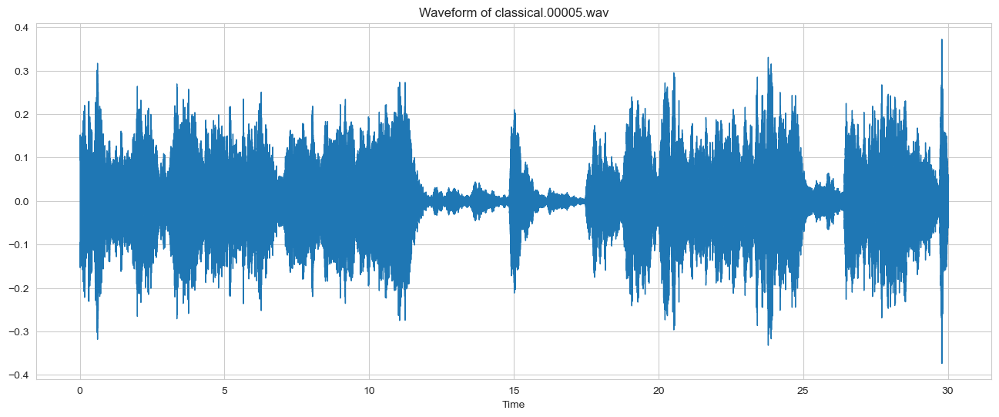

In [11]:
sound, sample_rate = librosa.load(r'C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\classical\classical.00005.wav')
print(sound[:5])
print(sample_rate)

plt.figure(figsize=(16, 6))
librosa.display.waveshow(y=sound, sr=sample_rate)
plt.title("Waveform of classical.00005.wav", fontsize=12)  
plt.show()

## Short Time Fourier Transform

Shape of D object: (1025, 1293)


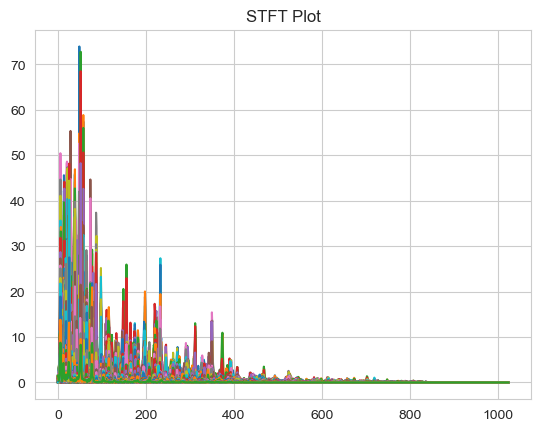

In [12]:
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(sound, n_fft = n_fft, hop_length = hop_length))
plt.plot(D)
plt.title("STFT Plot")
print('Shape of D object:', np.shape(D))

## Obtaining MFCC in Frequency and decibel scale

Mel frequency coefficients:
 [[5.1203251e-01 2.3015177e-01 1.0695749e-02 ... 3.3842906e-02
  1.6199809e-01 2.3991237e+00]
 [2.1316602e+00 1.8792455e+00 1.5512857e+00 ... 1.9809666e+01
  2.1258059e+01 2.1489925e+01]
 [9.1015329e+00 2.2005646e+01 2.2548300e+01 ... 3.2586414e+02
  2.8465729e+02 1.8047960e+02]
 ...
 [1.6938283e-06 4.2530039e-07 1.0779897e-08 ... 8.0184268e-09
  3.8091966e-07 1.9909974e-05]
 [1.4851496e-06 3.7101898e-07 6.5502519e-09 ... 5.1877511e-09
  3.5853765e-07 1.8875291e-05]
 [1.4133041e-06 3.5268613e-07 6.5828876e-09 ... 4.3376156e-09
  3.5131598e-07 1.8426574e-05]]
Mel frequency coefficients in dB:
 [[-69.59169  -76.53735  -80.       ... -80.       -79.58744  -56.176586]
 [-57.203278 -58.297966 -59.963802 ... -37.840096 -37.227165 -37.132942]
 [-44.595345 -36.926956 -36.715363 ... -13.516907 -14.691189 -18.649078]
 ...
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [

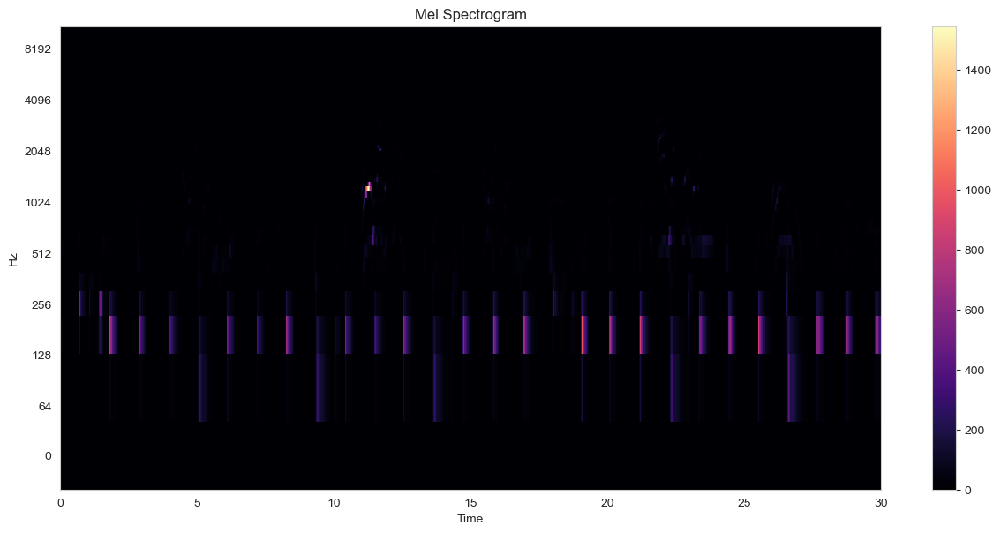

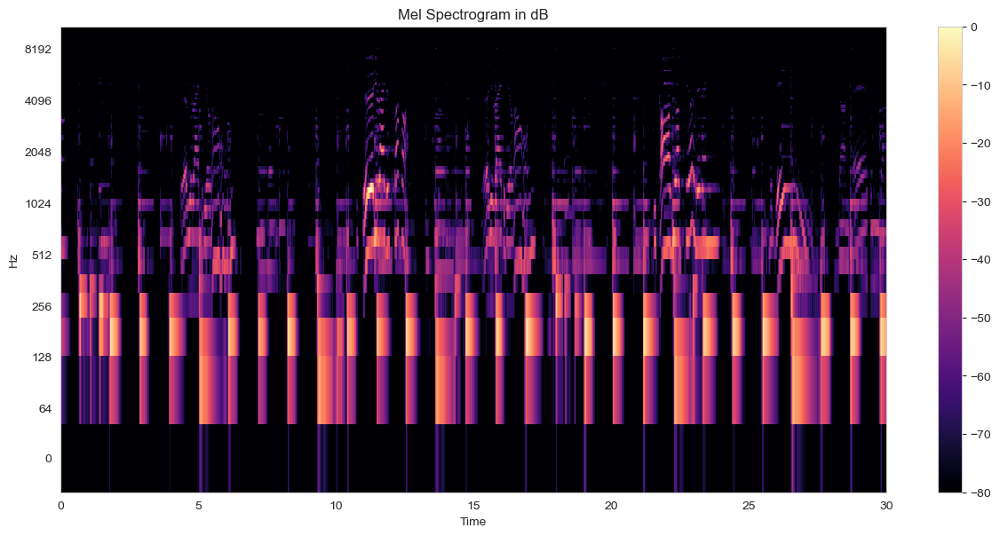

In [13]:
hop_length = 512 
mel_spec=librosa.feature.melspectrogram(y=audio_data,sr=sr)
print("Mel frequency coefficients:\n",mel_spec)
mel_spec_db=librosa.amplitude_to_db(mel_spec, ref=np.max)
plt.figure(figsize=(15,15))
plt.subplot(211)
lplt.specshow(mel_spec, sr=sr,hop_length=hop_length,x_axis='time',y_axis='log')
plt.colorbar()
plt.title("Mel Spectrogram")
plt.figure(figsize=(15,15))
plt.subplot(212)
print("Mel frequency coefficients in dB:\n",mel_spec_db)
lplt.specshow(mel_spec_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar()
plt.title("Mel Spectrogram in dB")
plt.show()

## Individual calculation of MFCC for each audio samples

In [14]:
import soundfile

def ef(filename,a):
    with soundfile.SoundFile(filename) as soundFile:
        X = soundFile.read(dtype = "float32")
        SR = soundFile.samplerate
        res = np.array([])
        if a=="mfcc":
            mfccs = np.mean(librosa.feature.mfcc(y = X, sr = SR, n_mfcc = 40).T, axis = 0)
            res = np.hstack((res, mfccs))
        if a=="mel":
            mel = np.mean(librosa.feature.melspectrogram(y = X, sr = SR).T, axis = 0)
            res = np.hstack((res, mel))
        return res

In [15]:
a="mfcc"
ef(r'C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\classical\classical.00005.wav',a)

array([-2.64335571e+02,  1.38179703e+02, -3.00964870e+01,  3.78366203e+01,
       -7.17312431e+00,  6.77408028e+00, -1.18097286e+01,  4.70563030e+00,
       -9.82599258e+00,  5.85912704e+00, -9.56316280e+00,  2.67685723e+00,
       -4.78871202e+00, -1.40705514e+00, -2.09166360e+00,  2.97329330e+00,
        3.35651851e+00,  4.81077433e+00,  1.75738478e+00, -1.83235884e+00,
        2.20806599e-02,  2.91544986e+00,  3.57327986e+00,  6.17050342e-02,
       -1.21065271e+00, -2.55474782e+00, -6.07608736e-01, -2.23343134e+00,
        8.80543768e-01, -3.08643222e+00, -1.35277677e+00,  8.02515507e-01,
        6.79166985e+00,  1.33455527e+00,  1.13458073e+00, -7.73334980e-01,
       -4.08256197e+00, -4.66696930e+00,  1.10009766e+00,  1.22633588e+00])

## STFT coefficients

In [16]:
filename=(r'C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\classical\classical.00005.wav')
with soundfile.SoundFile(filename) as soundFile:
    X = soundFile.read(dtype = "float32")
    SR = soundFile.samplerate
stft = np.abs(librosa.stft(X))
chroma = np.mean(librosa.feature.chroma_stft(S = stft, sr = SR).T, axis = 0)
chroma

array([0.52037114, 0.3354638 , 0.4454867 , 0.59242254, 0.37145886,
       0.47718975, 0.35303918, 0.5534597 , 0.58603495, 0.46870685,
       0.48589894, 0.36930892], dtype=float32)

In [17]:
stft

array([[1.2915019e+00, 3.8269645e-01, 6.9679546e-01, ..., 3.4704700e-01,
        5.9342521e-01, 1.5743682e+00],
       [1.3512259e+00, 7.4338877e-01, 7.6262450e-01, ..., 6.1654139e-01,
        1.1364616e+00, 1.2154224e+00],
       [1.5657762e+00, 7.0886427e-01, 9.7099805e-01, ..., 9.6593010e-01,
        6.9517094e-01, 3.7558648e-01],
       ...,
       [2.4665713e-03, 1.1565818e-03, 1.5269047e-04, ..., 1.0646870e-04,
        7.7405624e-05, 5.5320346e-04],
       [2.4648127e-03, 1.3397080e-03, 1.7954418e-04, ..., 1.4744767e-04,
        2.1366522e-04, 7.1203976e-04],
       [2.4199875e-03, 1.0162784e-03, 2.7316849e-04, ..., 7.3448115e-05,
        2.3006984e-04, 8.6419994e-04]], dtype=float32)

## Dataset Preprocessing and Normalisation

In [18]:
datas = data30.sample(frac=1).reset_index(drop=True)
data301 = data30.iloc[0:, 1:]
y = data301.label.values
X = data301.drop('label', axis = 1)

cols = X.columns
min_max_scaler = skp.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
Xnv=pd.DataFrame(np_scaled,columns=cols)
X=pd.DataFrame(np_scaled,columns=cols).values
Xnv

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.113487,0.362279,0.695468,0.318188,0.101983,0.314117,0.040233,0.422879,0.109789,0.385532,...,0.564186,0.112704,0.541287,0.057615,0.422444,0.082450,0.487950,0.109503,0.599189,0.078255
1,0.113487,0.343622,0.793392,0.230894,0.085580,0.248405,0.121475,0.436889,0.296867,0.353329,...,0.570198,0.120353,0.574685,0.118286,0.448184,0.102997,0.548800,0.099081,0.579640,0.075947
2,0.113487,0.389832,0.640692,0.433652,0.099064,0.254261,0.049046,0.325334,0.095712,0.289224,...,0.622467,0.081898,0.331003,0.085962,0.370988,0.116420,0.453724,0.087317,0.501381,0.045405
3,0.113487,0.473508,0.777954,0.345856,0.229160,0.129376,0.058253,0.267404,0.227566,0.181068,...,0.565151,0.091876,0.484549,0.092509,0.460684,0.068975,0.538690,0.062612,0.468060,0.048168
4,0.113487,0.277759,0.681062,0.219641,0.083075,0.327270,0.110761,0.325514,0.113536,0.357017,...,0.383289,0.200462,0.410225,0.156424,0.403875,0.120300,0.424652,0.130173,0.233047,0.094836
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.113487,0.366294,0.565355,0.188974,0.012317,0.372066,0.090548,0.462737,0.113776,0.442001,...,0.599764,0.093498,0.137363,0.070955,0.528217,0.067274,0.355114,0.108986,0.530772,0.084307
996,0.113487,0.461109,0.480368,0.181264,0.021099,0.371728,0.057513,0.448340,0.104735,0.428856,...,0.666628,0.064317,0.222386,0.064937,0.506174,0.052253,0.332575,0.067713,0.485401,0.047815
997,0.113487,0.529141,0.483246,0.194487,0.011492,0.390015,0.073870,0.394101,0.093465,0.413981,...,0.601418,0.063653,0.152848,0.057215,0.563199,0.064824,0.178146,0.076420,0.504920,0.043984
998,0.113487,0.387488,0.738721,0.200112,0.043603,0.214389,0.076729,0.352424,0.143718,0.285865,...,0.441895,0.096819,0.446369,0.075619,0.494291,0.059564,0.405462,0.088864,0.462871,0.066938


## Features and Labels

In [19]:
print("Feature component values with normalization:\n",X)
print("Labels:\n",y)

Feature component values with normalization:
 [[0.11348684 0.36227871 0.69546819 ... 0.10950252 0.59918888 0.07825493]
 [0.11348684 0.34362165 0.79339231 ... 0.09908114 0.57963963 0.07594669]
 [0.11348684 0.38983171 0.6406919  ... 0.08731703 0.50138091 0.04540464]
 ...
 [0.11348684 0.52914126 0.48324551 ... 0.07641964 0.50491985 0.04398425]
 [0.11348684 0.3874878  0.73872059 ... 0.08886446 0.46287061 0.06693823]
 [0.11348684 0.37918422 0.65027238 ... 0.15461063 0.59731769 0.08372859]]
Labels:
 ['blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues'
 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues'
 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues'
 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues'
 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues'
 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues'
 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues' 'blues

## Correlation Plot

<Axes: >

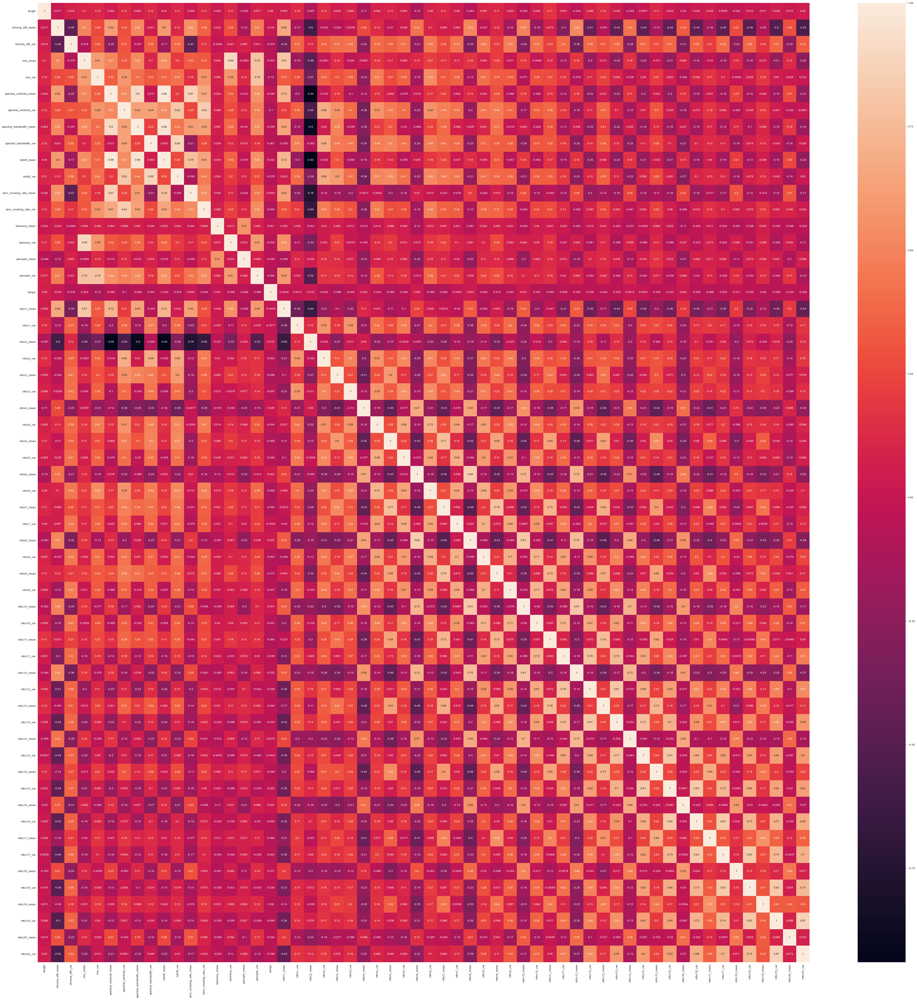

In [225]:
data301=data30.iloc[0:,1:]
data302=data301.drop("label",axis=1)
corr=data302.corr()
plt.figure(figsize=(60,60))
sns.heatmap(corr,annot=True)

## Supervised Learning algorithms for different models based on K-fold cross validation

In [20]:
def model_build1(model, kf, title = "Default"):
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy_scores.append(accuracy_score(y_test, y_pred))
    print("Accuracy score of", title, "is:", round(np.mean(accuracy_scores), 2))
    print("Classification report:",classification_report(y_test,y_pred))
    con_mat = confusion_matrix(y_test, y_pred)
    plt.figure(figsize = (16, 9))
    sns.heatmap(con_mat, annot=True, 
                xticklabels = ["blues", "classical", "country", "disco", 
                               "hiphop", "jazz", "metal", "pop", "reggae", "rock"], 
                yticklabels=["blues", "classical", "country", "disco", "hiphop", 
                             "jazz", "metal", "pop", "reggae", "rock"])
    plt.show()

## KNN Results

Accuracy score of K Nearest Neighbor is: 0.68
Classification report:               precision    recall  f1-score   support

       blues       0.90      0.82      0.86        11
   classical       0.69      1.00      0.82         9
     country       0.57      0.53      0.55        15
       disco       0.45      0.56      0.50         9
      hiphop       1.00      0.75      0.86         4
        jazz       0.80      0.44      0.57         9
       metal       0.86      0.75      0.80         8
         pop       0.88      0.70      0.78        10
      reggae       0.70      1.00      0.82         7
        rock       0.22      0.25      0.24         8

    accuracy                           0.67        90
   macro avg       0.71      0.68      0.68        90
weighted avg       0.69      0.67      0.67        90



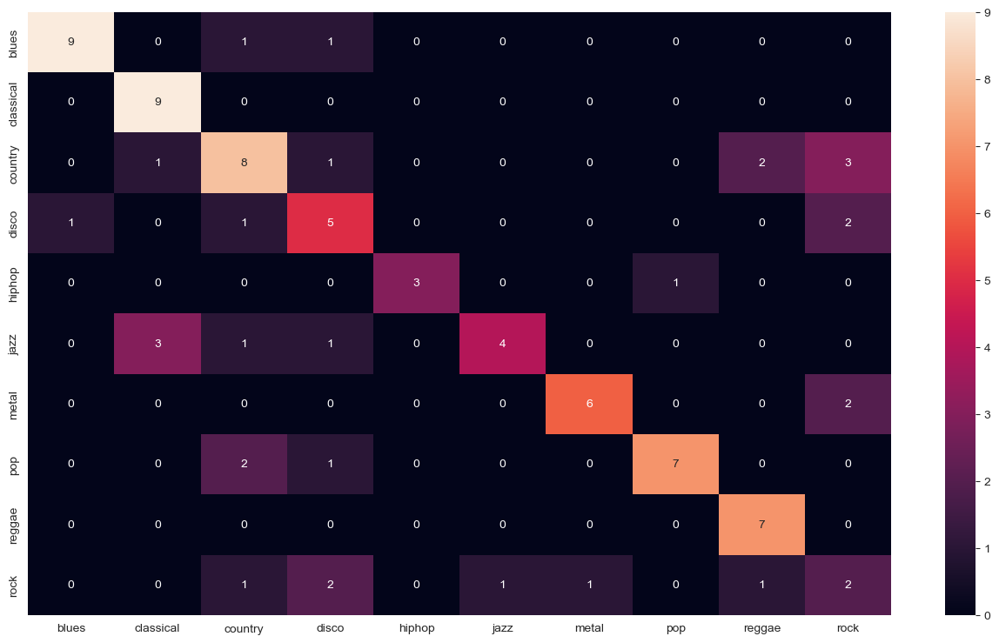

In [273]:
split = KFold(n_splits=11, shuffle=True)
knn=KNeighborsClassifier(n_neighbors=10)
model_build1(knn, split, 'K Nearest Neighbor')

## SVM Results

Accuracy score of SVM is: 0.75
Classification report:               precision    recall  f1-score   support

       blues       0.73      0.76      0.74        21
   classical       1.00      0.92      0.96        24
     country       0.75      0.77      0.76        31
       disco       0.42      0.79      0.55        14
      hiphop       1.00      0.76      0.87        17
        jazz       0.83      0.94      0.88        16
       metal       0.89      0.89      0.89        18
         pop       0.87      0.68      0.76        19
      reggae       0.87      0.68      0.76        19
        rock       0.58      0.52      0.55        21

    accuracy                           0.77       200
   macro avg       0.79      0.77      0.77       200
weighted avg       0.80      0.77      0.78       200



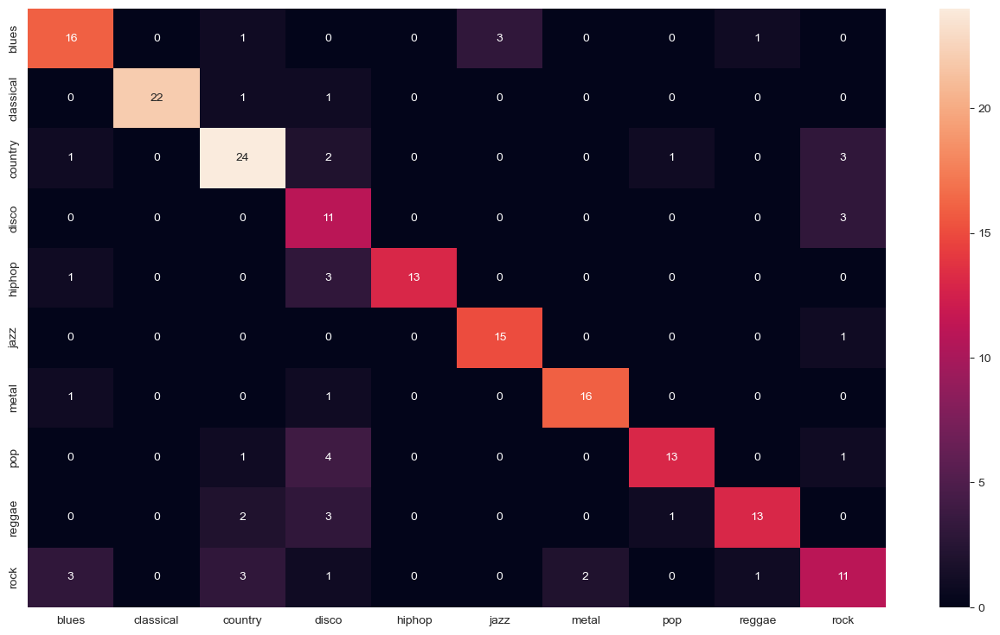

In [229]:
sv=SVC(kernel='poly',decision_function_shape="ovo")
model_build1(sv,split,"SVM")

## Random Forest Classifier Results

Accuracy score of Random Forest Classifier is: 0.78
Classification report:               precision    recall  f1-score   support

       blues       0.78      0.64      0.71        28
   classical       1.00      0.91      0.95        23
     country       0.59      0.72      0.65        18
       disco       0.81      0.81      0.81        16
      hiphop       0.88      0.82      0.85        17
        jazz       0.68      0.88      0.77        17
       metal       0.83      0.94      0.88        16
         pop       0.85      0.94      0.89        18
      reggae       0.69      0.58      0.63        19
        rock       0.69      0.64      0.67        28

    accuracy                           0.78       200
   macro avg       0.78      0.79      0.78       200
weighted avg       0.78      0.78      0.77       200



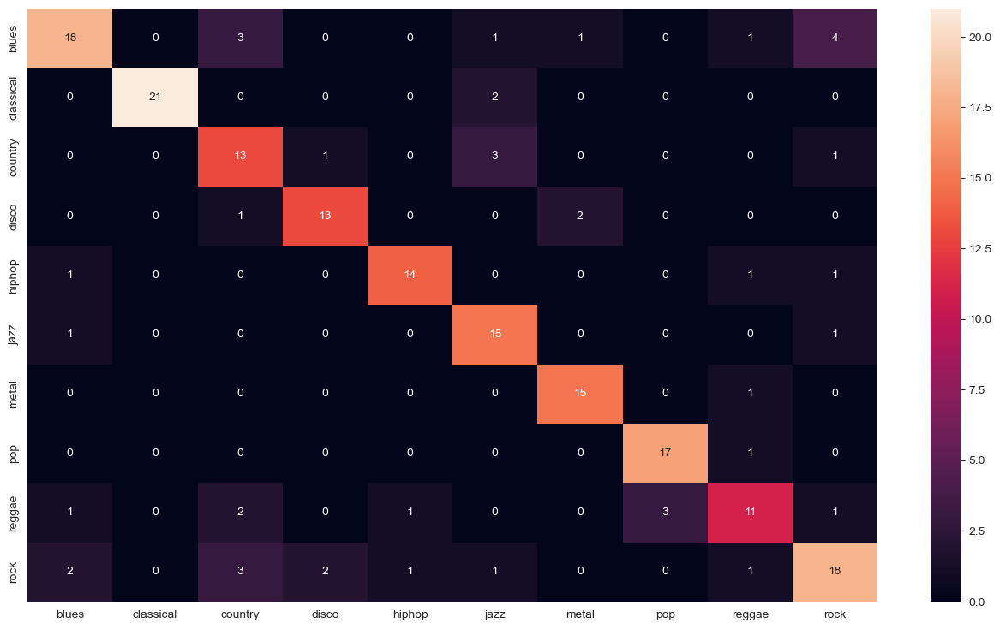

In [243]:
split1 = KFold(n_splits=5, shuffle=True)
rfc = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=10)
model_build1(rfc, split1, 'Random Forest Classifier')

## Feature Importance Plot with length included 

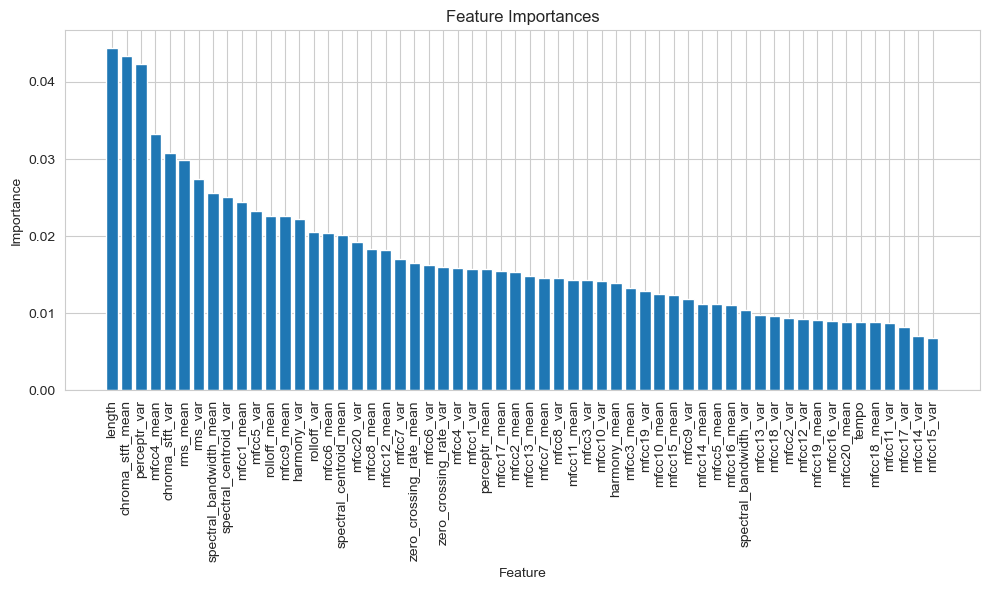

In [244]:
importances = rfc.feature_importances_
feature_names = data301.columns 
indices = importances.argsort()[::-1]

plt.figure(figsize=(10,6))
plt.title("Feature Importances")
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train.shape[1]), [feature_names[i] for i in indices], rotation=90)
plt.xlabel("Feature")
plt.ylabel("Importance")

plt.tight_layout()
plt.show()

In [21]:
def model_build2(model, kf, title = "Default"):
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        cv_scores = cross_val_score(model, X, y, cv=10, scoring='accuracy')
        m = tree_model.fit(X, y)
        prediction = m.predict(X_test)
        accuracy_scores.append(accuracy_score(y_test,prediction))
    print("Accuracy score of", title, "is:", round(np.mean(accuracy_scores), 2))
    print("Cross Validation Score:",cv_scores)
    cm = confusion_matrix(y_test,prediction)
    plt.figure(figsize = (16, 9))

    sns.heatmap(cm, annot=True, 
                xticklabels = ["blues", "classical", "country", "disco", 
                               "hiphop", "jazz", "metal", "pop", "reggae", "rock"], 
                yticklabels=["blues", "classical", "country", "disco", "hiphop", 
                             "jazz", "metal", "pop", "reggae", "rock"])
    plt.show()

## Decision Tree Results

Accuracy score of Decision Tree is: 0.65
Cross Validation Score: [0.35 0.56 0.55 0.38 0.54 0.39 0.58 0.61 0.46 0.46]


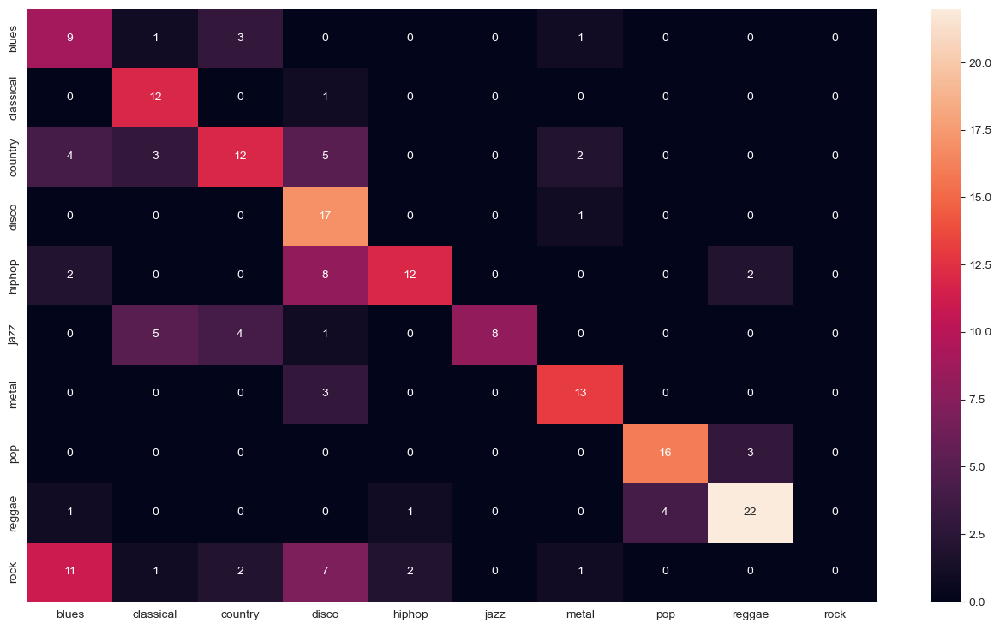

In [149]:
tree_model = DecisionTreeClassifier(max_depth=5, criterion='entropy')
model_build2(tree_model, split, title = "Decision Tree")

## Gradient Boost Results

Accuracy score of Gradient Boost is: 0.52
Classification report:               precision    recall  f1-score   support

       blues       0.38      0.35      0.36        17
   classical       0.90      0.86      0.88        21
     country       0.56      0.43      0.49        23
       disco       0.35      0.47      0.40        15
      hiphop       0.71      0.46      0.56        26
        jazz       0.53      0.75      0.62        12
       metal       0.00      0.00      0.00        25
         pop       0.83      0.62      0.71        24
      reggae       0.41      0.73      0.52        15
        rock       0.28      0.59      0.38        22

    accuracy                           0.51       200
   macro avg       0.49      0.53      0.49       200
weighted avg       0.50      0.51      0.49       200



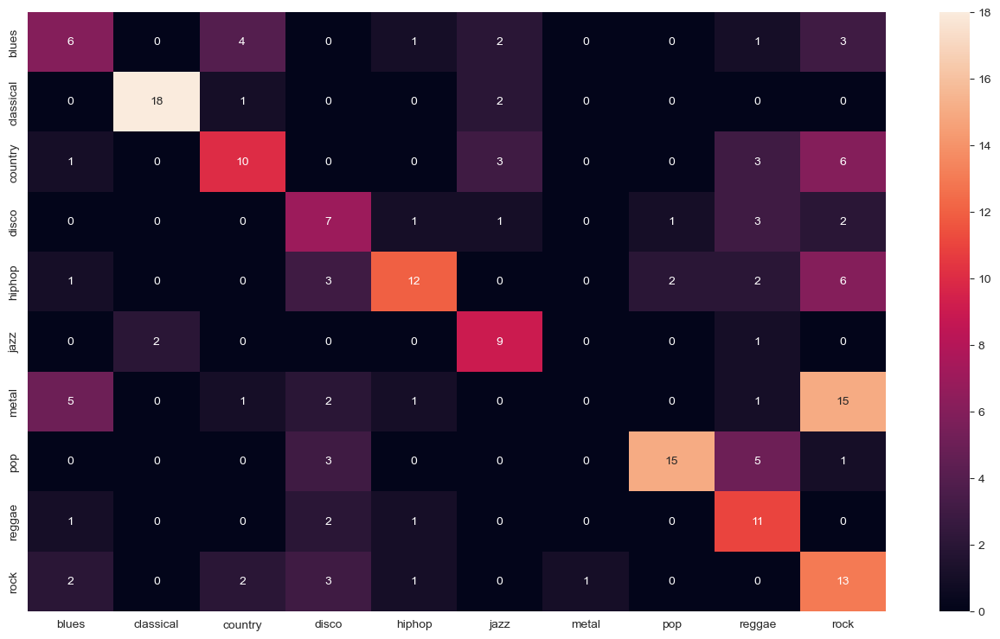

In [73]:
GBC = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,max_depth=1, random_state=0)
model_build1(GBC,split,title="Gradient Boost")

## Manual Train-Test Split algorithm

In [22]:
X_train,X_test,y_train,y_test=tts(Xnv,y,test_size=0.3,shuffle=True,random_state=42)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((700, 58), (300, 58), (700,), (300,))

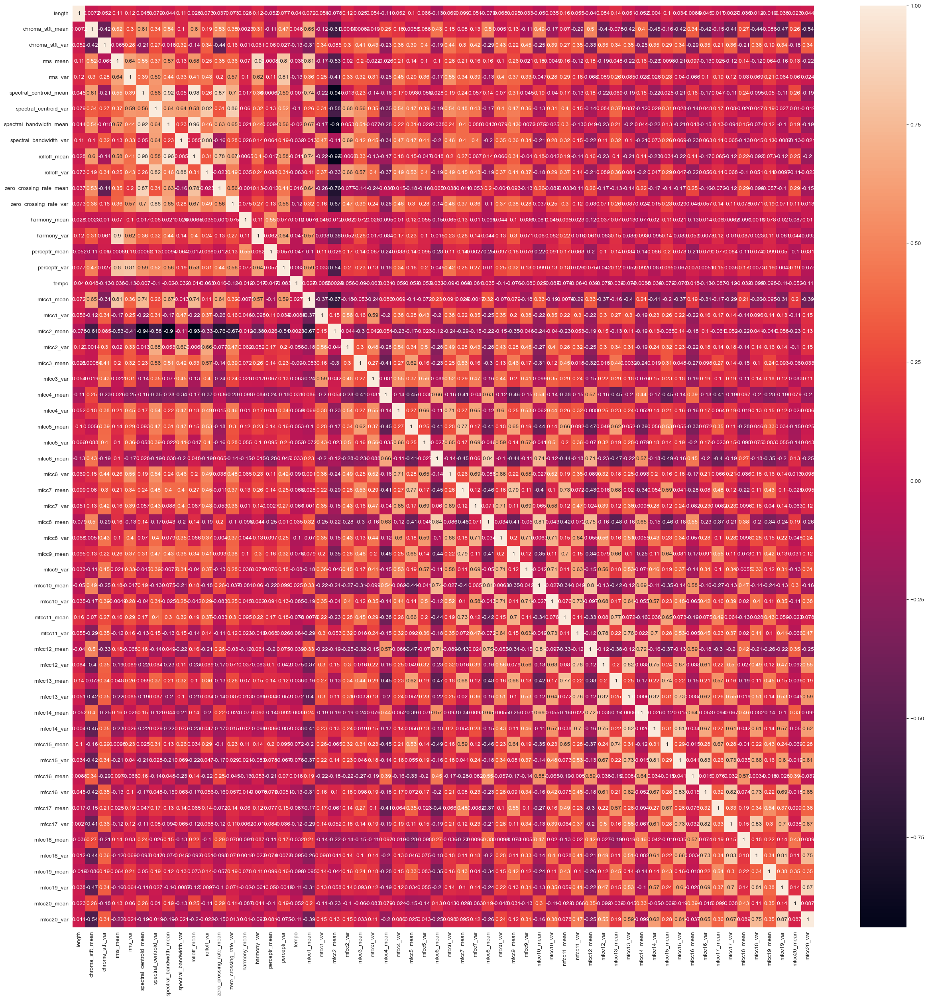

In [151]:
plt.figure(figsize=(30,30))
corr1=X_train.corr()
sns.heatmap(corr1,annot=True)
plt.show()

## Correlation comparision and dimension reduction

In [23]:
def correlation(dataset,threshold):
    col_corr = set()
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j])>threshold:
                colname=corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [26]:
corr_features = correlation(X_train,0.80)
len(set(corr_features))

19

In [27]:
X_train

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
541,0.113487,0.276994,0.707068,0.185868,0.060196,0.270983,0.050201,0.256697,0.010171,0.296962,...,0.545231,0.188388,0.579323,0.161673,0.252926,0.228560,0.519641,0.283814,0.360130,0.281686
440,1.000000,0.353489,0.781132,0.319779,0.387279,0.488242,0.690421,0.724497,0.717689,0.576467,...,0.564555,0.215668,0.407627,0.207380,0.246211,0.238992,0.457757,0.201895,0.420513,0.240837
482,0.113487,0.674391,0.607659,0.247075,0.076855,0.445281,0.123870,0.491632,0.070490,0.513539,...,0.860970,0.075330,0.643833,0.127991,0.498412,0.126220,0.572114,0.075846,0.610526,0.075844
422,0.113487,0.544184,0.661900,0.428575,0.225973,0.376571,0.164914,0.526374,0.196855,0.486122,...,0.640956,0.114922,0.443165,0.118321,0.608786,0.116323,0.433414,0.130540,0.485784,0.107255
778,0.095142,0.575106,0.659351,0.555886,0.471531,0.660537,0.310077,0.793459,0.308484,0.740006,...,0.488848,0.096657,0.535189,0.094358,0.436700,0.156268,0.535433,0.159264,0.536655,0.117211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.113487,0.182076,0.638184,0.071147,0.012436,0.207647,0.020631,0.260818,0.028278,0.250812,...,0.616173,0.197364,0.536436,0.215316,0.330367,0.267435,0.561544,0.195542,0.655300,0.189949
270,0.113487,0.393271,0.657055,0.354231,0.101171,0.353075,0.079948,0.410510,0.128575,0.416122,...,0.594906,0.143757,0.344071,0.088158,0.456352,0.093316,0.513430,0.059816,0.397000,0.071444
860,0.095142,0.258553,0.741660,0.052330,0.012185,0.472277,0.280986,0.537018,0.204266,0.509863,...,0.564509,0.126287,0.288101,0.213886,0.340377,0.090864,0.391863,0.142524,0.326536,0.120603
435,0.514929,0.727257,0.640439,0.475531,0.306195,0.583965,0.362659,0.741297,0.228111,0.687059,...,0.694836,0.087745,0.517444,0.073665,0.636629,0.109802,0.641395,0.080578,0.668115,0.071584


## Removed Features

In [28]:
corr_features

{'harmony_var',
 'mfcc10_mean',
 'mfcc13_var',
 'mfcc14_var',
 'mfcc15_var',
 'mfcc16_var',
 'mfcc17_var',
 'mfcc18_var',
 'mfcc19_var',
 'mfcc1_mean',
 'mfcc20_var',
 'mfcc2_mean',
 'mfcc8_mean',
 'perceptr_var',
 'rolloff_mean',
 'rolloff_var',
 'spectral_bandwidth_mean',
 'zero_crossing_rate_mean',
 'zero_crossing_rate_var'}

In [29]:
X_train.drop(corr_features,axis=1)
X_test.drop(corr_features,axis=1)

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_var,harmony_mean,perceptr_mean,...,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc14_mean,mfcc15_mean,mfcc16_mean,mfcc17_mean,mfcc18_mean,mfcc19_mean,mfcc20_mean
521,0.113487,0.530290,0.668097,0.108737,0.014698,0.606689,0.151234,0.065221,0.634846,0.576839,...,0.741901,0.048338,0.484555,0.669904,0.387079,0.865347,0.391130,0.523223,0.456358,0.635667
737,0.095142,0.569168,0.640396,0.600230,0.290188,0.690306,0.207120,0.228599,0.632686,0.466432,...,0.452070,0.177267,0.760804,0.485840,0.634570,0.517666,0.524310,0.378879,0.538777,0.449897
740,0.095142,0.244689,0.645340,0.494151,0.203332,0.360135,0.083659,0.246486,0.633960,0.565597,...,0.516403,0.177665,0.734998,0.314554,0.737783,0.655481,0.581028,0.416612,0.576738,0.507940
660,0.113487,0.749188,0.236134,0.306812,0.022797,0.451536,0.035438,0.038462,0.632853,0.474512,...,0.647815,0.028941,0.300868,0.459097,0.386973,0.608750,0.362977,0.591481,0.454885,0.614511
411,0.113487,0.553279,0.639556,0.505471,0.238303,0.394644,0.139456,0.146212,0.633138,0.464077,...,0.584021,0.153554,0.300596,0.564576,0.215471,0.700832,0.502206,0.685942,0.382510,0.457868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,0.113487,0.508702,0.694260,0.569313,0.432482,0.510903,0.235448,0.208213,0.633748,0.604840,...,0.443913,0.087335,0.619160,0.338105,0.441922,0.386980,0.421681,0.280271,0.366336,0.422553
935,0.113487,0.580110,0.547996,0.302731,0.016426,0.335569,0.128943,0.395691,0.633261,0.462970,...,0.485542,0.048615,0.765455,0.433191,0.645672,0.514896,0.599054,0.400496,0.389608,0.540630
428,0.106022,0.411879,0.756272,0.380192,0.045008,0.570194,0.281939,0.228627,0.643606,0.641910,...,0.516171,0.133036,0.726361,0.442973,0.666509,0.644925,0.319470,0.498289,0.507655,0.471603
7,0.113487,0.276598,0.760707,0.322248,0.199704,0.228093,0.145813,0.230154,0.634353,0.548958,...,0.227825,0.235264,0.591111,0.147960,0.286951,0.249314,0.232115,0.043111,0.416041,0.320089


In [30]:
X_train

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
541,0.113487,0.276994,0.707068,0.185868,0.060196,0.270983,0.050201,0.256697,0.010171,0.296962,...,0.545231,0.188388,0.579323,0.161673,0.252926,0.228560,0.519641,0.283814,0.360130,0.281686
440,1.000000,0.353489,0.781132,0.319779,0.387279,0.488242,0.690421,0.724497,0.717689,0.576467,...,0.564555,0.215668,0.407627,0.207380,0.246211,0.238992,0.457757,0.201895,0.420513,0.240837
482,0.113487,0.674391,0.607659,0.247075,0.076855,0.445281,0.123870,0.491632,0.070490,0.513539,...,0.860970,0.075330,0.643833,0.127991,0.498412,0.126220,0.572114,0.075846,0.610526,0.075844
422,0.113487,0.544184,0.661900,0.428575,0.225973,0.376571,0.164914,0.526374,0.196855,0.486122,...,0.640956,0.114922,0.443165,0.118321,0.608786,0.116323,0.433414,0.130540,0.485784,0.107255
778,0.095142,0.575106,0.659351,0.555886,0.471531,0.660537,0.310077,0.793459,0.308484,0.740006,...,0.488848,0.096657,0.535189,0.094358,0.436700,0.156268,0.535433,0.159264,0.536655,0.117211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0.113487,0.182076,0.638184,0.071147,0.012436,0.207647,0.020631,0.260818,0.028278,0.250812,...,0.616173,0.197364,0.536436,0.215316,0.330367,0.267435,0.561544,0.195542,0.655300,0.189949
270,0.113487,0.393271,0.657055,0.354231,0.101171,0.353075,0.079948,0.410510,0.128575,0.416122,...,0.594906,0.143757,0.344071,0.088158,0.456352,0.093316,0.513430,0.059816,0.397000,0.071444
860,0.095142,0.258553,0.741660,0.052330,0.012185,0.472277,0.280986,0.537018,0.204266,0.509863,...,0.564509,0.126287,0.288101,0.213886,0.340377,0.090864,0.391863,0.142524,0.326536,0.120603
435,0.514929,0.727257,0.640439,0.475531,0.306195,0.583965,0.362659,0.741297,0.228111,0.687059,...,0.694836,0.087745,0.517444,0.073665,0.636629,0.109802,0.641395,0.080578,0.668115,0.071584


In [31]:
def SVM(X_train, y_train, X_test, y_test):
    svm = SVC()
    svm.fit(X_train, y_train)
    y_pred_svm=svm.predict(X_test)
    svm_acc = accuracy_score(y_test, y_pred_svm)
    return svm_acc

def DecisionTree(X_train, y_train, X_test, y_test):
    dtree = DecisionTreeClassifier()
    dtree.fit(X_train, y_train)
    y_pred_dtree=dtree.predict(X_test)
    dtree_acc = accuracy_score(y_test, y_pred_dtree)
    return dtree_acc

def NaiveBayes(X_train, y_train, X_test, y_test):
    nb = GaussianNB()
    nb.fit(X_train, y_train)
    y_pred_nb = nb.predict(X_test)
    nb_acc = accuracy_score(y_test, y_pred_nb)
    return nb_acc

def GradientBoost(X_train, y_train, X_test, y_test):
    GBC = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,max_depth=1, random_state=0).fit(X_train, y_train)
    gbc_acc = GBC.score(X_test, y_test)
    return gbc_acc
    
def RandomForest(X_train, y_train, X_test, y_test):
    rf = RandomForestClassifier()
    rf.fit(X_train, y_train)
    y_pred_rf = rf.predict(X_test)
    rf_acc = accuracy_score(y_test, y_pred_rf)
    return rf_acc

def PC(X_train, y_train, X_test, y_test):
    perc = make_pipeline(StandardScaler(),SGDClassifier(loss="perceptron", max_iter=1000, tol=1e-3))
    perc.fit(X_train, y_train)
    y_pred_perceptron = perc.predict(X_test)
    perceptron_acc = accuracy_score(y_test, y_pred_perceptron)
    return perceptron_acc
    
    
    
print("SVM Accuracy: ", SVM(X_train, y_train, X_test, y_test))
print("Decision Tree: ", DecisionTree(X_train, y_train, X_test, y_test))
print("Naive Bayes: ", NaiveBayes(X_train, y_train, X_test, y_test))
print("Gradient Boost: ", GradientBoost(X_train, y_train, X_test, y_test))
print("Random Forest: ", RandomForest(X_train, y_train, X_test, y_test))
print("Perceptron: ", PC(X_train, y_train, X_test, y_test))

SVM Accuracy:  0.6433333333333333
Decision Tree:  0.5366666666666666
Naive Bayes:  0.49
Gradient Boost:  0.52
Random Forest:  0.7433333333333333
Perceptron:  0.62


## Feature Importance Plot with Length feature

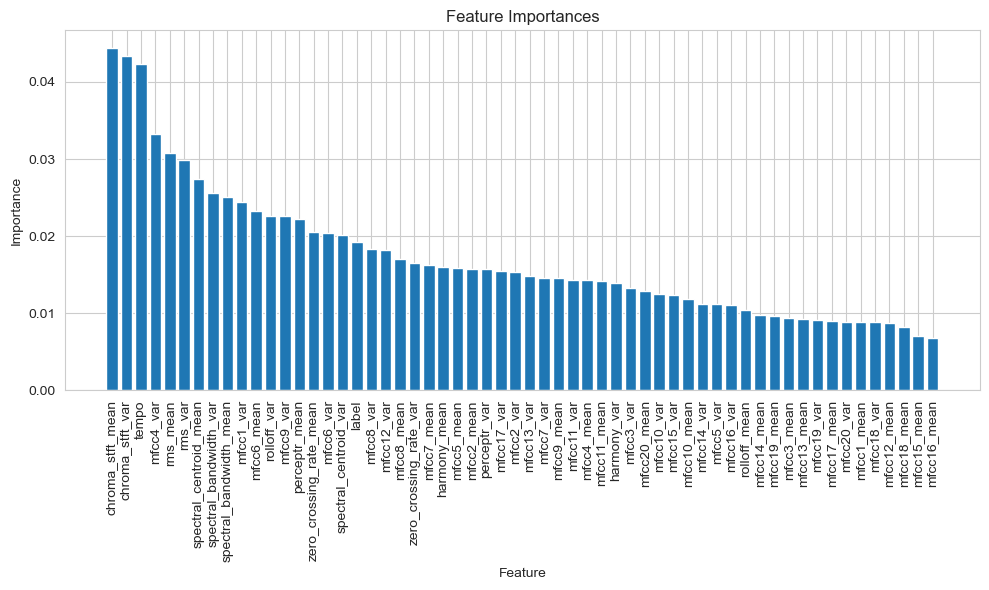

In [255]:
data302 = data30.iloc[0:, 2:]
importances1 = rfc.feature_importances_
feature_names1 = data302.columns 
indices1 = importances1.argsort()[::-1]

plt.figure(figsize=(10,6))
plt.title("Feature Importances")
plt.bar(range(X_train.shape[1]), importances1[indices], align="center")
plt.xticks(range(X_train.shape[1]), [feature_names1[i] for i in indices], rotation=90)
plt.xlabel("Feature")
plt.ylabel("Importance")

plt.tight_layout()
plt.show()

## Box PLot for tempo feature (BPM)

     label       tempo
0    blues  123.046875
1    blues   67.999589
2    blues  161.499023
3    blues   63.024009
4    blues  135.999178
..     ...         ...
995   rock  103.359375
996   rock  117.453835
997   rock  129.199219
998   rock   73.828125
999   rock  123.046875

[1000 rows x 2 columns]


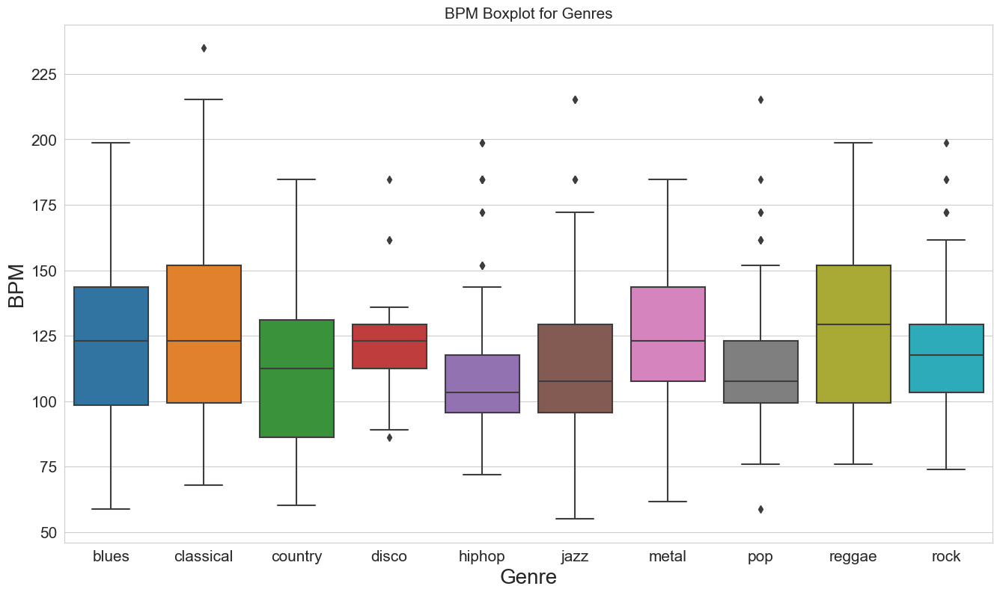

In [23]:
import seaborn as sns
label_tempo_df= data30[['label', 'tempo']]
print(label_tempo_df)
f, ax = plt.subplots(figsize = (16,9))
sns.boxplot(x='label',y='tempo',data=label_tempo_df)

plt.title('BPM Boxplot for Genres', fontsize = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Genre', fontsize = 20)
plt.ylabel('BPM', fontsize = 20)
plt.show()

## 3 seconds dataset

In [32]:
data03=pd.read_csv(r"C:\Users\sanja\OneDrive\Desktop\SEM 4\AIML\Dataset\case_study_features_3_sec.csv")
data03.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [33]:
data03.describe()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,9990.0,9990.000000,9990.000000,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,...,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000
mean,66149.0,0.379534,0.084876,0.130859,2.676388e-03,2199.219431,4.166727e+05,2241.385959,1.182711e+05,4566.076592,...,1.448240,49.988755,-4.198706,51.962753,0.739943,52.488851,-2.497306,54.973829,-0.917584,57.322614
std,0.0,0.090466,0.009637,0.068545,3.585628e-03,751.860611,4.349644e+05,543.854449,1.013505e+05,1642.065335,...,5.735149,34.442816,5.677379,36.400669,5.181313,38.177120,5.111799,41.585677,5.253243,46.444212
min,66149.0,0.107108,0.015345,0.000953,4.379535e-08,472.741636,8.118813e+02,499.162910,1.183520e+03,658.336276,...,-26.850016,1.325786,-27.809795,1.624544,-20.733809,3.437439,-27.448456,3.065302,-35.640659,0.282131
25%,66149.0,0.315698,0.079833,0.083782,6.145900e-04,1630.680158,1.231961e+05,1887.455790,4.876553e+04,3378.311110,...,-2.227478,29.584894,-7.951722,29.863448,-2.516638,29.636197,-5.734123,30.496412,-4.004475,30.011365
50%,66149.0,0.384741,0.085108,0.121253,1.491318e-03,2208.628236,2.650692e+05,2230.575595,8.996072e+04,4631.377892,...,1.461623,41.702393,-4.443021,42.393583,0.733772,41.831377,-2.702366,43.435253,-1.030939,44.332155
75%,66149.0,0.442443,0.091092,0.176328,3.130862e-03,2712.581884,5.624152e+05,2588.340505,1.585674e+05,5591.634521,...,5.149752,59.274619,-0.726945,61.676964,3.888734,62.033906,0.514246,65.328602,2.216603,68.210421
max,66149.0,0.749481,0.120964,0.442567,3.261522e-02,5432.534406,4.794119e+06,3708.147554,1.235143e+06,9487.446477,...,39.144405,683.932556,34.048843,529.363342,36.970322,629.729797,31.365425,1143.230591,34.212101,910.473206


## Normalisation and Preprocessing 

In [34]:
dataS= data03.sample(frac=1).reset_index(drop=True)
data031 = data03.iloc[0:, 1:]
Ynv=data031.label
Y = data031.label.values
x = data031.drop('label', axis = 1)

cols2 = x.columns
min_max_scaler2 = skp.MinMaxScaler()
np_scaled2 = min_max_scaler2.fit_transform(x)
xnv=pd.DataFrame(np_scaled2,columns=cols2)
x=pd.DataFrame(np_scaled2,columns=cols2).values
xnv

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.0,0.355399,0.716757,0.293133,0.107955,0.262173,0.034784,0.459205,0.094130,0.346153,...,0.363613,0.056198,0.397172,0.066062,0.371828,0.055344,0.380831,0.026797,0.506746,0.047781
1,0.0,0.367322,0.670347,0.253040,0.044447,0.270969,0.018716,0.470831,0.052261,0.363722,...,0.468596,0.092912,0.351681,0.074001,0.362068,0.076365,0.418452,0.082414,0.593029,0.065548
2,0.0,0.373159,0.728067,0.296753,0.141663,0.265293,0.023073,0.494051,0.059922,0.378215,...,0.479681,0.096704,0.420979,0.050639,0.400536,0.067509,0.433742,0.043841,0.546264,0.036062
3,0.0,0.399349,0.677066,0.298024,0.075042,0.238427,0.023187,0.455246,0.066234,0.329587,...,0.386258,0.067995,0.387474,0.050617,0.380430,0.050030,0.405824,0.041898,0.562204,0.034873
4,0.0,0.355668,0.689113,0.322308,0.052149,0.233460,0.016451,0.451651,0.047830,0.318453,...,0.438567,0.042500,0.460314,0.083860,0.388590,0.076524,0.409019,0.020763,0.517913,0.031713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,0.0,0.376757,0.617031,0.111106,0.002984,0.206932,0.034101,0.380041,0.068680,0.266983,...,0.494342,0.060299,0.302553,0.069546,0.285713,0.044089,0.371046,0.040116,0.536263,0.042502
9986,0.0,0.413243,0.637013,0.128944,0.002687,0.277274,0.058465,0.438552,0.079860,0.349793,...,0.438282,0.045545,0.249505,0.122777,0.305915,0.081395,0.263338,0.052963,0.516365,0.020232
9987,0.0,0.374196,0.697548,0.116503,0.021500,0.176099,0.138139,0.331163,0.111494,0.202062,...,0.391617,0.112660,0.408760,0.038190,0.442668,0.035995,0.496892,0.039921,0.505937,0.045380
9988,0.0,0.436537,0.657745,0.148266,0.009825,0.324968,0.042367,0.473422,0.017567,0.413964,...,0.469334,0.039551,0.362864,0.029532,0.471308,0.028749,0.506738,0.019101,0.519900,0.013740


In [35]:
Ynv

0       blues
1       blues
2       blues
3       blues
4       blues
        ...  
9985     rock
9986     rock
9987     rock
9988     rock
9989     rock
Name: label, Length: 9990, dtype: object

In [36]:
print("Feature component values with normalization:\n",x)
print("Labels:\n",Y)

Feature component values with normalization:
 [[0.         0.3553988  0.71675699 ... 0.02679679 0.50674637 0.04778078]
 [0.         0.36732176 0.67034733 ... 0.08241395 0.59302914 0.06554772]
 [0.         0.37315856 0.72806736 ... 0.0438406  0.5462638  0.03606165]
 ...
 [0.         0.37419556 0.69754793 ... 0.03992147 0.50593726 0.04538043]
 [0.         0.43653695 0.65774457 ... 0.01910101 0.51990048 0.01373955]
 [0.         0.40815099 0.67614332 ... 0.03194326 0.46137225 0.03454808]]
Labels:
 ['blues' 'blues' 'blues' ... 'rock' 'rock' 'rock']


## Correlation plot

<Axes: >

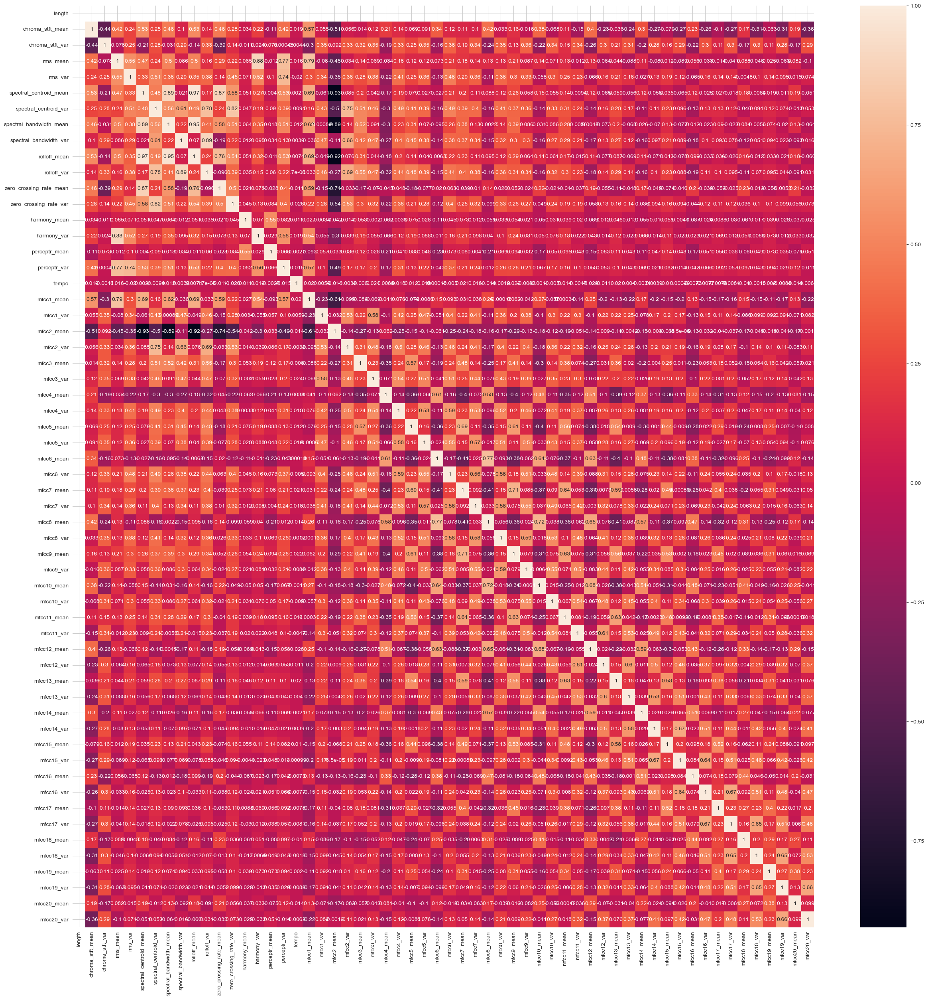

In [11]:
data032=data031.drop("label",axis=1)
corr2=data032.corr()
plt.figure(figsize=(30,30))
sns.heatmap(corr2,annot=True)

## Model building and testing based on K-fold cross validation

In [37]:
def model_build3(model, kf, title = "Default"):
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    for train_index, test_index in kf.split(x):
        x_train, x_test = x[train_index], x[test_index]
        Y_train, Y_test = Y[train_index], Y[test_index]
        model.fit(x_train, Y_train)
        Y_pred = model.predict(x_test)
        accuracy_scores.append(accuracy_score(Y_test, Y_pred))
    print("Accuracy score of", title, "is:", round(np.mean(accuracy_scores), 2))
    print("Classification report:",classification_report(Y_test,Y_pred))
    con_mat = confusion_matrix(Y_test, Y_pred)
    plt.figure(figsize = (16, 9))
    sns.heatmap(con_mat, annot=True, 
                xticklabels = ["blues", "classical", "country", "disco", 
                               "hiphop", "jazz", "metal", "pop", "reggae", "rock"], 
                yticklabels=["blues", "classical", "country", "disco", "hiphop", 
                             "jazz", "metal", "pop", "reggae", "rock"])
    plt.show()

Accuracy score of K Nearest Neighbor is: 0.89
Classification report:               precision    recall  f1-score   support

       blues       0.95      0.95      0.95        91
   classical       0.87      1.00      0.93        76
     country       0.83      0.83      0.83        88
       disco       0.81      0.88      0.84       104
      hiphop       0.88      0.89      0.88        89
        jazz       0.92      0.91      0.91        98
       metal       0.99      0.93      0.96        83
         pop       0.94      0.89      0.91        81
      reggae       0.91      0.92      0.91       107
        rock       0.89      0.78      0.83        91

    accuracy                           0.89       908
   macro avg       0.90      0.90      0.90       908
weighted avg       0.90      0.89      0.89       908



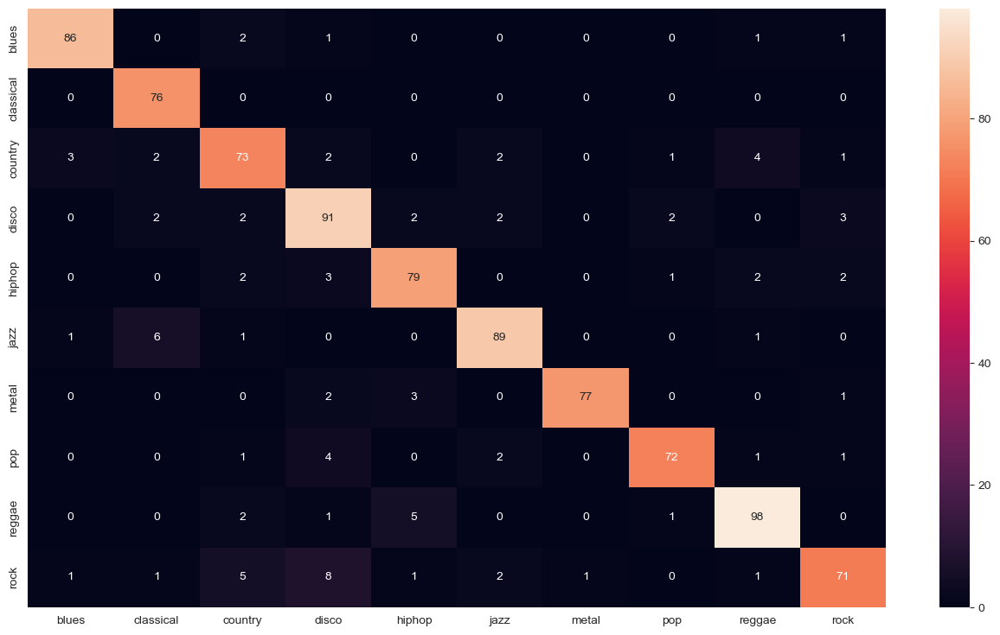

In [15]:
split1=KFold(n_splits=11, shuffle=True)
knn1=KNeighborsClassifier(n_neighbors=10)
model_build3(knn1, split1, 'K Nearest Neighbor')

Accuracy score of SVM is: 0.81
Classification report:               precision    recall  f1-score   support

       blues       0.83      0.82      0.83       101
   classical       0.89      0.99      0.94       103
     country       0.69      0.68      0.69       106
       disco       0.71      0.79      0.75        81
      hiphop       0.87      0.80      0.83       106
        jazz       0.83      0.85      0.84        86
       metal       0.94      0.90      0.92        93
         pop       0.92      0.87      0.89       128
      reggae       0.78      0.81      0.79        85
        rock       0.67      0.64      0.65       110

    accuracy                           0.81       999
   macro avg       0.81      0.82      0.81       999
weighted avg       0.81      0.81      0.81       999



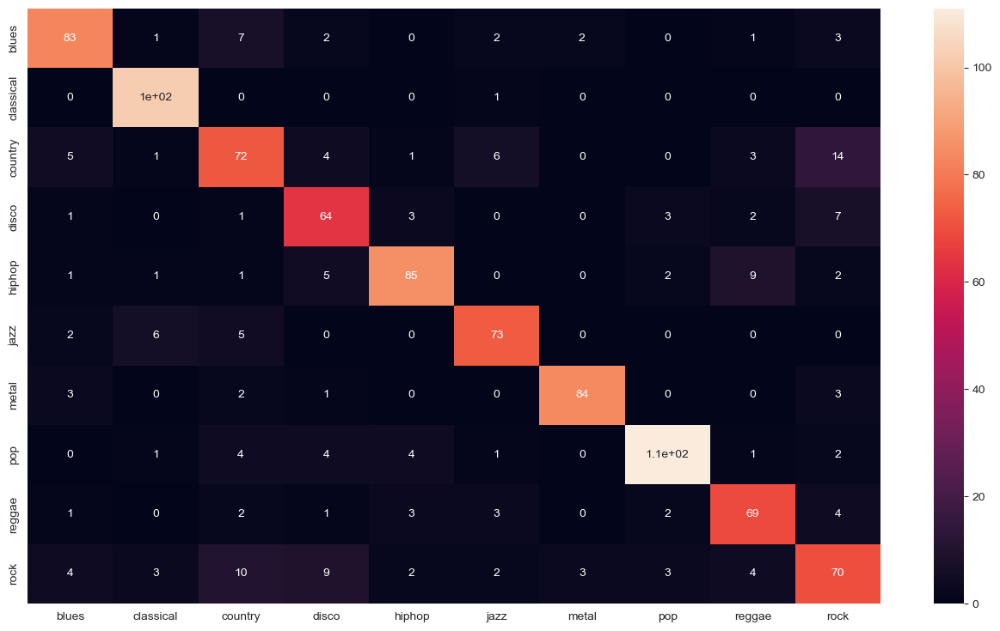

In [21]:
split2=KFold(n_splits=10,shuffle=True)
sv1=SVC(kernel='poly',decision_function_shape="ovo")
model_build3(sv1,split2,"SVM")

Accuracy score of Random Forest Classifier is: 0.81
Classification report:               precision    recall  f1-score   support

       blues       0.83      0.81      0.82       190
   classical       0.93      0.92      0.92       204
     country       0.75      0.78      0.77       202
       disco       0.74      0.76      0.75       198
      hiphop       0.85      0.74      0.79       194
        jazz       0.78      0.88      0.83       198
       metal       0.85      0.94      0.89       202
         pop       0.87      0.87      0.87       211
      reggae       0.71      0.80      0.76       205
        rock       0.79      0.57      0.66       194

    accuracy                           0.81      1998
   macro avg       0.81      0.81      0.80      1998
weighted avg       0.81      0.81      0.81      1998



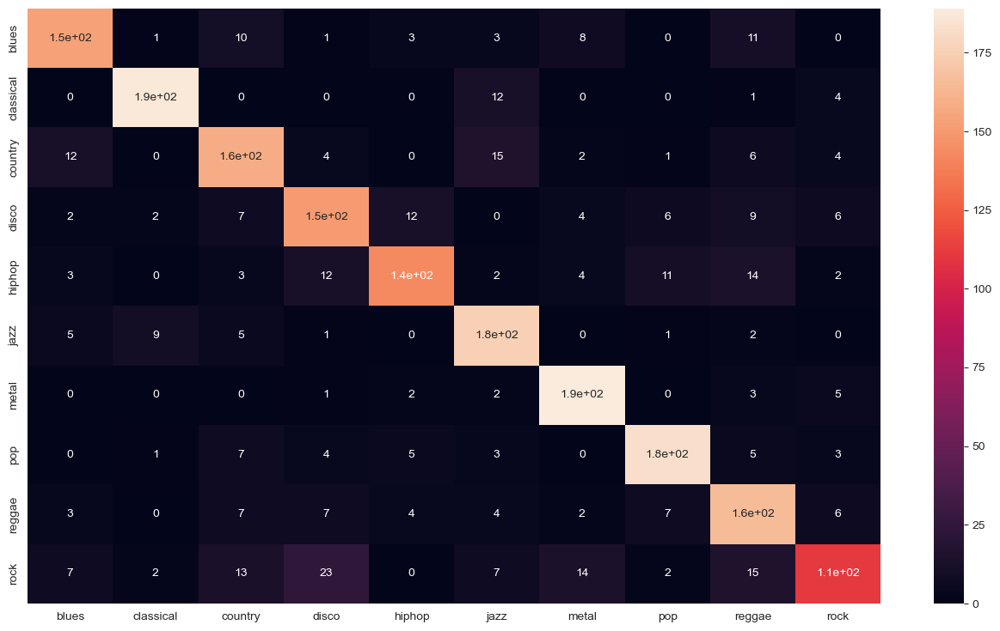

In [22]:
split3 = KFold(n_splits=5, shuffle=True)
rfc1 = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=10)
model_build3(rfc1, split3, 'Random Forest Classifier')

## Feature Importance plot with length feature

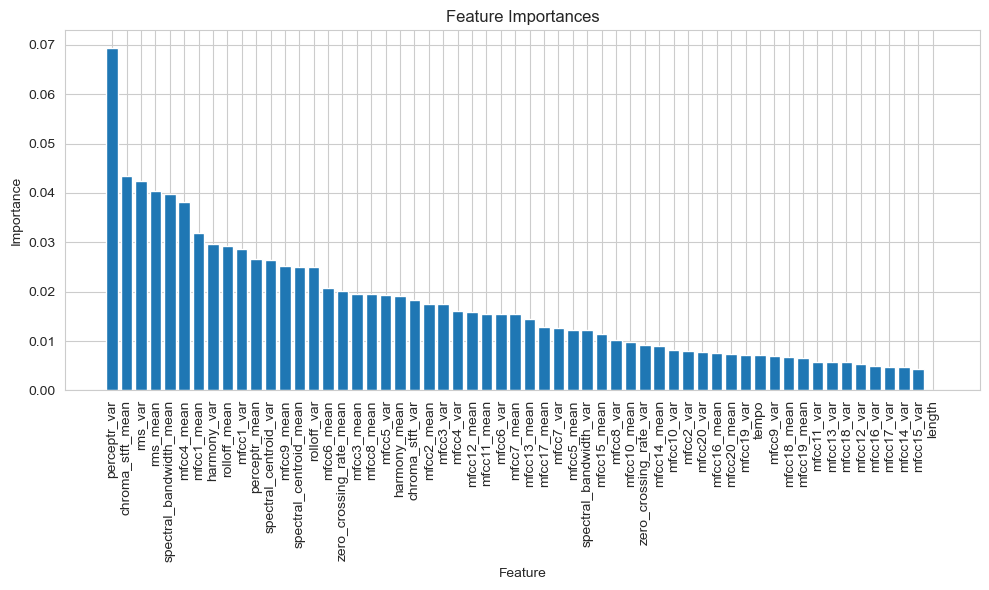

In [50]:
importances3 = rfc1.feature_importances_
feature_names3 = data031.columns 
indices3 = importances3.argsort()[::-1]

plt.figure(figsize=(10,6))
plt.title("Feature Importances")
plt.bar(range(x_train.shape[1]),importances3[indices3], align="center")
plt.xticks(range(x_train.shape[1]),[feature_names3[i] for i in indices3],rotation=90)
plt.xlabel("Feature")
plt.ylabel("Importance")

plt.tight_layout()
plt.show()

In [38]:
def model_build4(model,kf,title = "Default"):
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    for train_index, test_index in kf.split(x):
        x_train, x_test = x[train_index], x[test_index]
        Y_train, Y_test = Y[train_index], Y[test_index]
        cv_scores = cross_val_score(model, x, Y, cv=10, scoring='accuracy')
        m = tree_model1.fit(x, Y)
        prediction = m.predict(x_test)
        accuracy_scores.append(accuracy_score(Y_test, prediction))
    print("Accuracy score of", title, "is:", round(np.mean(accuracy_scores), 2))
    print("Classification report:",classification_report(Y_test,prediction))
    con_mat = confusion_matrix(Y_test, prediction)
    plt.figure(figsize = (16, 9))
    sns.heatmap(con_mat, annot=True, 
                xticklabels = ["blues", "classical", "country", "disco", 
                               "hiphop", "jazz", "metal", "pop", "reggae", "rock"], 
                yticklabels=["blues", "classical", "country", "disco", "hiphop", 
                             "jazz", "metal", "pop", "reggae", "rock"])
    plt.show()

Accuracy score of Decision Tree is: 0.49
Classification report:               precision    recall  f1-score   support

       blues       0.40      0.43      0.41       103
   classical       0.92      0.84      0.88       108
     country       0.31      0.51      0.38       117
       disco       0.25      0.27      0.26        82
      hiphop       0.46      0.54      0.50        98
        jazz       0.56      0.67      0.61        92
       metal       0.72      0.69      0.71        91
         pop       0.82      0.65      0.73       101
      reggae       0.40      0.31      0.35       115
        rock       0.50      0.12      0.19        92

    accuracy                           0.51       999
   macro avg       0.53      0.50      0.50       999
weighted avg       0.53      0.51      0.51       999



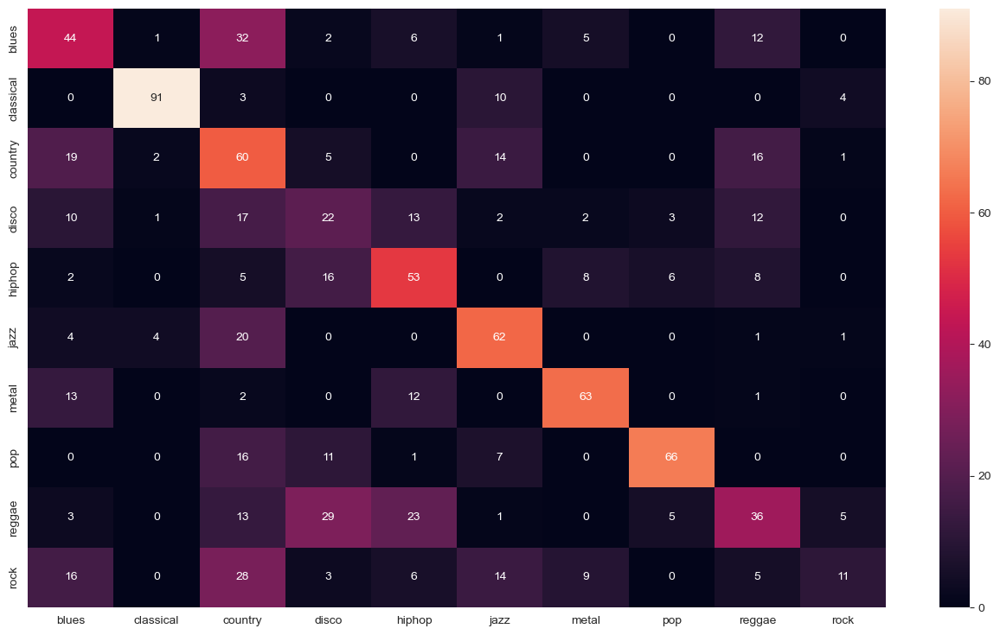

In [48]:
tree_model1 = DecisionTreeClassifier(max_depth=5, criterion='entropy')
model_build4(tree_model1, split2, title = "Decision Tree")

## Manual train-test split algorithm

In [39]:
x_train,x_test,Y_train,Y_test=tts(xnv,Y,test_size=0.3,shuffle=True,random_state=42)
x_train.shape,x_test.shape,Y_train.shape,Y_test.shape

((6993, 58), (2997, 58), (6993,), (2997,))

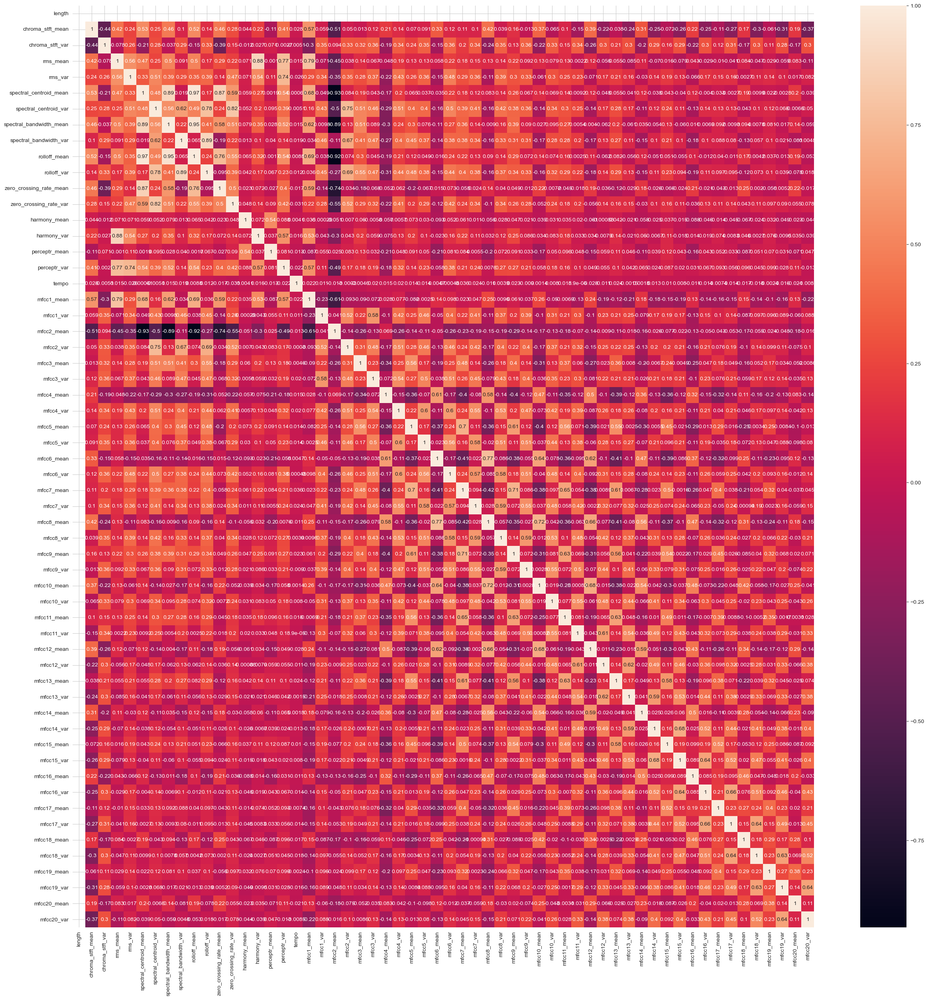

In [36]:
plt.figure(figsize=(30,30))
corr4=x_train.corr()
sns.heatmap(corr4,annot=True)
plt.show()

## Correlation comparision and dimension reduction (Feature removal)

In [40]:
def correlation2(dataset,threshold):
    col_corr = set()
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j])>threshold:
                colname=corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [41]:
corr_features2 = correlation2(x_train,0.80)
len(set(corr_features2))

7

In [42]:
x_train

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
5857,0.0,0.322690,0.613228,0.122849,0.009801,0.780330,0.066511,0.909234,0.033790,0.931402,...,0.363189,0.067154,0.443893,0.089822,0.328114,0.208321,0.690828,0.101287,0.559287,0.066071
3686,0.0,0.411991,0.613345,0.245306,0.049779,0.335556,0.062322,0.547874,0.027827,0.468135,...,0.425825,0.028310,0.320951,0.077642,0.460309,0.044498,0.388694,0.025575,0.555607,0.041148
9930,0.0,0.417454,0.532384,0.266641,0.007891,0.437386,0.007949,0.511397,0.017132,0.489091,...,0.447840,0.041419,0.206173,0.031109,0.398446,0.034413,0.288411,0.023788,0.488970,0.025831
5214,0.0,0.171703,0.718445,0.085815,0.029576,0.281640,0.103658,0.510428,0.160832,0.382530,...,0.715538,0.058282,0.708352,0.309818,0.601208,0.499104,0.671258,0.128210,0.557552,0.090202
3761,0.0,0.353409,0.701114,0.320633,0.069877,0.356203,0.042619,0.527273,0.060071,0.448718,...,0.471289,0.071256,0.421586,0.051600,0.458909,0.074415,0.347736,0.056431,0.512500,0.061116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,0.0,0.250076,0.762759,0.219443,0.117742,0.385278,0.101954,0.642889,0.292839,0.516481,...,0.317640,0.044637,0.375073,0.064530,0.283500,0.035674,0.413191,0.024577,0.416212,0.069384
5191,0.0,0.219733,0.628763,0.091270,0.003336,0.185579,0.011046,0.424186,0.031643,0.264450,...,0.515206,0.064696,0.385465,0.023487,0.387703,0.020829,0.491369,0.024332,0.729122,0.147939
5390,0.0,0.206906,0.742198,0.187505,0.070445,0.147442,0.022333,0.276992,0.018786,0.203338,...,0.361798,0.111575,0.492097,0.077233,0.381883,0.082383,0.494171,0.040240,0.539568,0.104910
860,0.0,0.402313,0.728236,0.242915,0.070321,0.209499,0.264402,0.399625,0.225179,0.253813,...,0.520349,0.104801,0.315600,0.249358,0.363916,0.061379,0.388265,0.055619,0.485205,0.030359


## Removed Features

In [43]:
corr_features2

{'harmony_var',
 'mfcc2_mean',
 'rolloff_mean',
 'rolloff_var',
 'spectral_bandwidth_mean',
 'zero_crossing_rate_mean',
 'zero_crossing_rate_var'}

In [44]:
x_train.drop(corr_features2,axis=1)
x_test.drop(corr_features2,axis=1)

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_var,harmony_mean,perceptr_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
4022,0.0,0.462542,0.772012,0.202143,0.019575,0.190181,0.096897,0.149399,0.609905,0.435593,...,0.480365,0.080034,0.370627,0.097526,0.377247,0.027333,0.394629,0.024705,0.468215,0.037228
5412,0.0,0.212463,0.652902,0.201970,0.028512,0.147884,0.010029,0.019129,0.619556,0.522880,...,0.343715,0.035364,0.372759,0.045668,0.219801,0.024240,0.299011,0.044376,0.351191,0.013691
487,0.0,0.386052,0.673366,0.293521,0.036694,0.367201,0.038280,0.087353,0.562096,0.318586,...,0.426217,0.094528,0.369003,0.050395,0.286379,0.068705,0.314305,0.039078,0.465390,0.037573
39,0.0,0.436178,0.729716,0.337213,0.165009,0.118684,0.026635,0.099281,0.629571,0.566849,...,0.446344,0.088176,0.331991,0.099559,0.372051,0.042931,0.426896,0.041012,0.422598,0.019860
6795,0.0,0.486134,0.607292,0.345348,0.046319,0.456982,0.016879,0.009177,0.629756,0.547433,...,0.578005,0.039509,0.386161,0.045095,0.423566,0.049404,0.309644,0.054452,0.529684,0.062340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1579,0.0,0.371776,0.671026,0.100720,0.002176,0.112946,0.001717,0.001002,0.611207,0.531201,...,0.264600,0.044288,0.585339,0.049349,0.610509,0.031803,0.519527,0.045177,0.506220,0.023185
7905,0.0,0.490615,0.791403,0.575644,0.348264,0.613987,0.137193,0.094515,0.630491,0.565097,...,0.348424,0.058154,0.334037,0.058743,0.308349,0.079024,0.395377,0.066253,0.477930,0.079248
6113,0.0,0.735156,0.350206,0.245352,0.002606,0.492809,0.007294,0.013064,0.630766,0.551100,...,0.471649,0.027458,0.292423,0.033541,0.426891,0.021122,0.405044,0.019151,0.526434,0.027543
3532,0.0,0.481718,0.589793,0.440139,0.077404,0.486259,0.104631,0.085102,0.629269,0.544095,...,0.471540,0.055825,0.432622,0.085322,0.456881,0.047181,0.475913,0.067051,0.527726,0.039754


In [45]:
x_train

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
5857,0.0,0.322690,0.613228,0.122849,0.009801,0.780330,0.066511,0.909234,0.033790,0.931402,...,0.363189,0.067154,0.443893,0.089822,0.328114,0.208321,0.690828,0.101287,0.559287,0.066071
3686,0.0,0.411991,0.613345,0.245306,0.049779,0.335556,0.062322,0.547874,0.027827,0.468135,...,0.425825,0.028310,0.320951,0.077642,0.460309,0.044498,0.388694,0.025575,0.555607,0.041148
9930,0.0,0.417454,0.532384,0.266641,0.007891,0.437386,0.007949,0.511397,0.017132,0.489091,...,0.447840,0.041419,0.206173,0.031109,0.398446,0.034413,0.288411,0.023788,0.488970,0.025831
5214,0.0,0.171703,0.718445,0.085815,0.029576,0.281640,0.103658,0.510428,0.160832,0.382530,...,0.715538,0.058282,0.708352,0.309818,0.601208,0.499104,0.671258,0.128210,0.557552,0.090202
3761,0.0,0.353409,0.701114,0.320633,0.069877,0.356203,0.042619,0.527273,0.060071,0.448718,...,0.471289,0.071256,0.421586,0.051600,0.458909,0.074415,0.347736,0.056431,0.512500,0.061116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,0.0,0.250076,0.762759,0.219443,0.117742,0.385278,0.101954,0.642889,0.292839,0.516481,...,0.317640,0.044637,0.375073,0.064530,0.283500,0.035674,0.413191,0.024577,0.416212,0.069384
5191,0.0,0.219733,0.628763,0.091270,0.003336,0.185579,0.011046,0.424186,0.031643,0.264450,...,0.515206,0.064696,0.385465,0.023487,0.387703,0.020829,0.491369,0.024332,0.729122,0.147939
5390,0.0,0.206906,0.742198,0.187505,0.070445,0.147442,0.022333,0.276992,0.018786,0.203338,...,0.361798,0.111575,0.492097,0.077233,0.381883,0.082383,0.494171,0.040240,0.539568,0.104910
860,0.0,0.402313,0.728236,0.242915,0.070321,0.209499,0.264402,0.399625,0.225179,0.253813,...,0.520349,0.104801,0.315600,0.249358,0.363916,0.061379,0.388265,0.055619,0.485205,0.030359


In [46]:
def SVM(X_train, y_train, X_test, y_test):
    svm = SVC()
    svm.fit(X_train, y_train)
    y_pred_svm=svm.predict(X_test)
    svm_acc = accuracy_score(y_test, y_pred_svm)
    return svm_acc

def DecisionTree(X_train, y_train, X_test, y_test):
    dtree = DecisionTreeClassifier()
    dtree.fit(X_train, y_train)
    y_pred_dtree=dtree.predict(X_test)
    dtree_acc = accuracy_score(y_test, y_pred_dtree)
    return dtree_acc

def NaiveBayes(X_train, y_train, X_test, y_test):
    nb = GaussianNB()
    nb.fit(X_train, y_train)
    y_pred_nb = nb.predict(X_test)
    nb_acc = accuracy_score(y_test, y_pred_nb)
    return nb_acc

def GradientBoost(X_train, y_train, X_test, y_test):
    GBC = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,max_depth=1, random_state=0).fit(X_train, y_train)
    gbc_acc = GBC.score(X_test, y_test)
    return gbc_acc
    
def RandomForest(X_train, y_train, X_test, y_test):
    rf = RandomForestClassifier()
    rf.fit(X_train, y_train)
    y_pred_rf = rf.predict(X_test)
    rf_acc = accuracy_score(y_test, y_pred_rf)
    return rf_acc

def PC(X_train, y_train, X_test, y_test):
    perc = make_pipeline(StandardScaler(),SGDClassifier(loss="perceptron", max_iter=1000, tol=1e-3))
    perc.fit(X_train, y_train)
    y_pred_perceptron = perc.predict(X_test)
    perceptron_acc = accuracy_score(y_test, y_pred_perceptron)
    return perceptron_acc
print("SVM Accuracy: ", SVM(x_train, Y_train, x_test, Y_test))
print("Decision Tree: ", DecisionTree(x_train, Y_train, x_test, Y_test))
print("Naive Bayes: ", NaiveBayes(x_train,Y_train, x_test, Y_test))
print("Random Forest: ", RandomForest(x_train, Y_train, x_test, Y_test))
print("Perceptron: ", PC(x_train, Y_train, x_test, Y_test))

SVM Accuracy:  0.7540874207540874
Decision Tree:  0.645311978645312
Naive Bayes:  0.5195195195195195
Random Forest:  0.8618618618618619
Perceptron:  0.5932599265932599


## Feature importance plot without length feature 

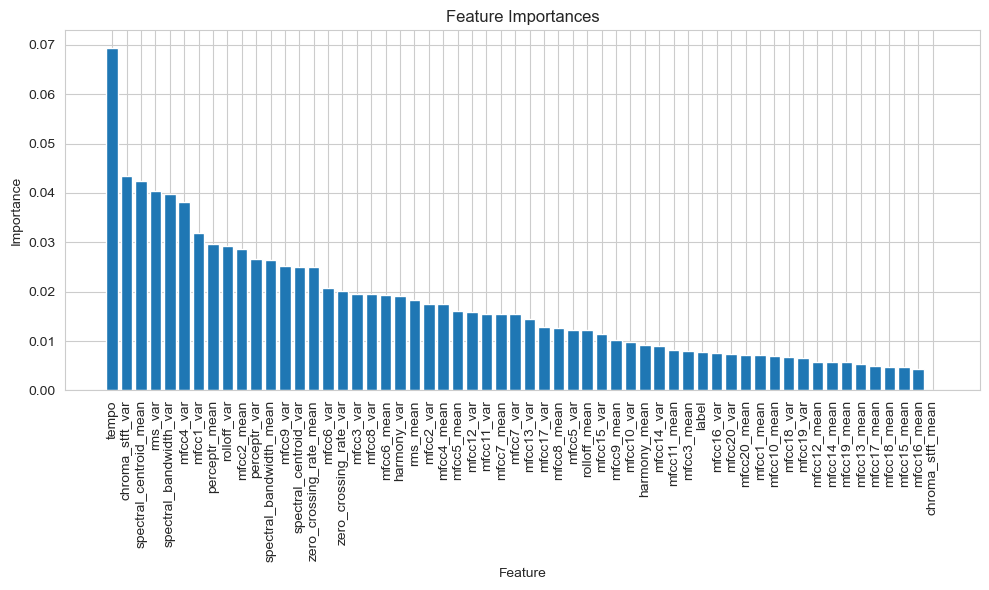

In [54]:
data032 = data03.iloc[0:, 2:]
importances4 = rfc1.feature_importances_
feature_names4 = data032.columns 
indices4 = importances4.argsort()[::-1]

plt.figure(figsize=(10,6))
plt.title("Feature Importances")
plt.bar(range(x_train.shape[1]),importances4[indices4], align="center")
plt.xticks(range(x_train.shape[1]),[feature_names4[i] for i in indices4],rotation=90)
plt.xlabel("Feature")
plt.ylabel("Importance")

plt.tight_layout()
plt.show()

## Box plot for tempo feature (BPM)

      label       tempo
0     blues  129.199219
1     blues  123.046875
2     blues  123.046875
3     blues  123.046875
4     blues  123.046875
...     ...         ...
9985   rock  123.046875
9986   rock   83.354335
9987   rock  123.046875
9988   rock  123.046875
9989   rock  234.907670

[9990 rows x 2 columns]


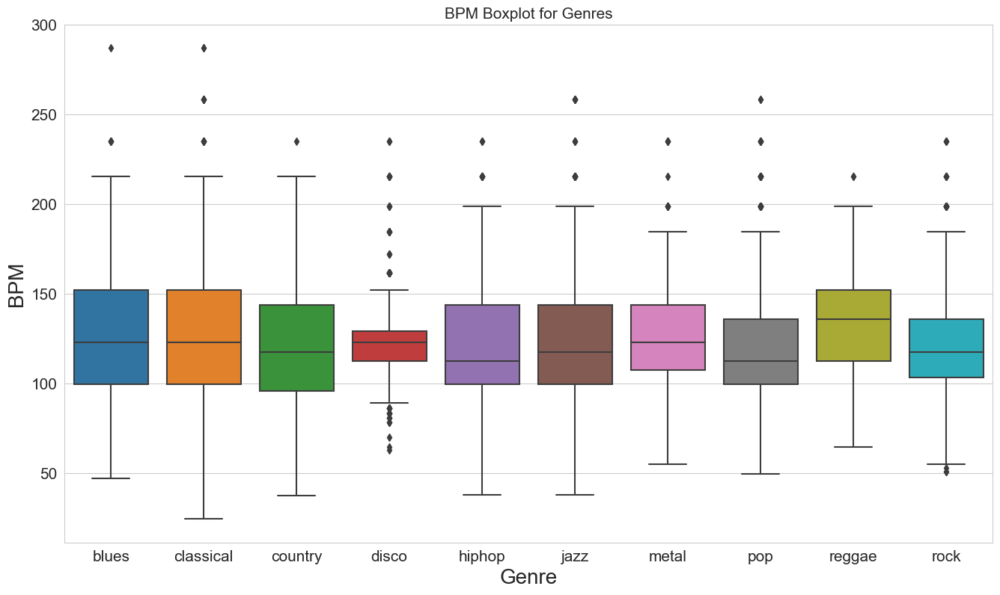

In [39]:
import seaborn as sns
label_tempo_df1= data03[['label', 'tempo']]
print(label_tempo_df1)
f1,ax1 = plt.subplots(figsize = (16,9))
sns.boxplot(x='label',y='tempo',data=label_tempo_df1)

plt.title('BPM Boxplot for Genres', fontsize = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Genre', fontsize = 20)
plt.ylabel('BPM', fontsize = 20)
plt.show()

## Incorporation of Cosine Similarity to recognise similar songs from the dataset 

In [47]:
import IPython.display as ipd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing

dAtA = pd.read_csv(r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\features_3_sec.csv", index_col='filename')
Ydf=dAtA[["label"]]
xdf=dAtA.drop(columns=['length','label'])

# Scale the data
data_scaled=preprocessing.scale(xdf)

# Cosine similarity
similarity = cosine_similarity(data_scaled)
print("Similarity shape:", similarity.shape)

# Convert into a dataframe and then set the row index and column names as labels
sim_df_labels = pd.DataFrame(similarity)

sim_df_names = sim_df_labels.set_index(Ydf.index)
sim_df_names.columns = Ydf.index

sim_df_names

Similarity shape: (9990, 9990)


filename,blues.00000.0.wav,blues.00000.1.wav,blues.00000.2.wav,blues.00000.3.wav,blues.00000.4.wav,blues.00000.5.wav,blues.00000.6.wav,blues.00000.7.wav,blues.00000.8.wav,blues.00000.9.wav,...,rock.00099.0.wav,rock.00099.1.wav,rock.00099.2.wav,rock.00099.3.wav,rock.00099.4.wav,rock.00099.5.wav,rock.00099.6.wav,rock.00099.7.wav,rock.00099.8.wav,rock.00099.9.wav
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.0.wav,1.000000,0.566223,0.574240,0.762002,0.761645,0.650941,0.695498,0.766532,0.760135,0.627689,...,0.221833,0.154208,-0.013789,0.372188,0.456640,0.387531,0.382302,0.048050,0.457812,0.353021
blues.00000.1.wav,0.566223,1.000000,0.639639,0.749346,0.615946,0.605654,0.692011,0.641135,0.786465,0.765471,...,0.412396,0.519078,-0.069361,0.570347,0.617002,0.634812,0.509724,-0.040774,0.553467,0.329800
blues.00000.2.wav,0.574240,0.639639,1.000000,0.659545,0.715466,0.595426,0.750551,0.733546,0.525333,0.580205,...,0.290419,0.320014,0.056435,0.469341,0.306737,0.432974,0.198399,0.037191,0.530360,0.192676
blues.00000.3.wav,0.762002,0.749346,0.659545,1.000000,0.796544,0.787118,0.772266,0.810613,0.729950,0.617242,...,0.257953,0.348760,-0.088100,0.524289,0.524339,0.515108,0.395785,-0.035468,0.542242,0.327122
blues.00000.4.wav,0.761645,0.615946,0.715466,0.796544,1.000000,0.749515,0.806425,0.843051,0.619045,0.618250,...,0.339456,0.362799,-0.159643,0.502492,0.489419,0.527737,0.423894,-0.091949,0.589148,0.380534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
rock.00099.5.wav,0.387531,0.634812,0.432974,0.515108,0.527737,0.455920,0.514065,0.525340,0.439123,0.584961,...,0.673853,0.498818,-0.042491,0.616053,0.826042,1.000000,0.744165,0.056462,0.608187,0.548458
rock.00099.6.wav,0.382302,0.509724,0.198399,0.395785,0.423894,0.418646,0.402772,0.300972,0.376381,0.504528,...,0.497874,0.449029,-0.075645,0.596243,0.787910,0.744165,1.000000,-0.012411,0.531216,0.509811
rock.00099.7.wav,0.048050,-0.040774,0.037191,-0.035468,-0.091949,-0.186678,-0.019277,-0.063080,0.073449,-0.059809,...,0.074584,0.255665,0.904822,0.221534,0.003949,0.056462,-0.012411,1.000000,0.162598,0.113301


In [48]:
def recog(name):
    series = sim_df_names[name].sort_values(ascending = False)
    series = series.drop(name)
    topfive = series.head(5)
    songnames = topfive.index.tolist()
    
    address_list = [r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\blues",
                   r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\classical",
                   r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\country",
                   r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\disco",
                   r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\hiphop",
                   r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\jazz",
                   r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\metal",
                   r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\pop",
                   r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\reggae",
                   r"C:\Users\sanja\OneDrive\Desktop\SEM 4\DSP\LAB\Data\genres_original\rock"]
    
    genre_list = ["blues", "classical", "country", "disco", 
                  "hiphop", "jazz", "metal", "pop", "reggae", "rock"]
    songlist = []
    songnames = []
    for songname in topfive.index:
        songgenre = songname.split('.')[0]
        address = genre_list.index(songgenre)
        fileaddress = address_list[address] + ("/") + songname
        songlist.append(fileaddress)
        songnames.append(songname)
    return songlist, songnames

In [57]:
current_song = 'country.00010.5.wav'
playlist, songname = recog(current_song)
print('Similar songs:\n\n', pd.Series(songname))

Similar songs:

 0    country.00010.8.wav
1    country.00010.4.wav
2    country.00022.9.wav
3        pop.00005.0.wav
4    country.00028.4.wav
dtype: object
